# Microbiome analysis for semi-synthetic setup

The notebook reproduces the simulation experiments for the semi-synthetic setup in the paper [__A causal view on compositional data__](https://arxiv.org/abs/2106.11234) by E. Ailer, C. L. Müller and N. Kilbertus.


For the semi-synthetic setup, we first aggregated the microbiome data on a family level. We have 57 datapoints and 47 distinct microbiome families. We estimate relevant parameters from this dataset. Nevertheless, we do not have interventional data available and thus we miss the ground truth. To overcome this, we sample from the estimated parameters and we make a few further assumptions on the confounding term to be able to construct a ground truth. We evaluate the methods on this ground truth.

<div class="alert alert-block alert-info">
<b>Note:</b>    
    
Unfortunately, we personally cannot share the data. We refer to the paper for further references. 
Nevertheless, we can share the parameters we used from our model.
    
</div>

In [16]:
import sys
import os
sys.path.append(os.path.join(os.getcwd(), "../src"))

import logging
import jax
import jax.numpy as np
import numpy as onp
import skbio.stats.composition as cmp
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import statsmodels.api as sm
from datetime import datetime

from simulate_data_fct import sim_IV_negbinomial
from plot_fct import update_layout, img_path, update_layout_px, colours, plot_ilr_X_vs_Y
from run_methods_all import run_methods_confidence_interval
from plot_fct import plot_mse_results, plot_beta_results
from run_methods_all import run_methods_all
from method_fct import LinearInstrumentModel

In [17]:
key = jax.random.PRNGKey(191)

# Parameter estimation and data generation

## Data read in

In [18]:
# load real data on different aggregation levels

data = pd.read_csv(os.path.join(os.getcwd(), "otu_familylevel.csv"), index_col=0)

Yreal = data.iloc[-1, :].values
Xreal_count = data[data.sum(axis=1)!=0].iloc[:-1, :].T.values
n, p = Xreal_count.shape
num_inst = 1  # number of instruments, here only 1
Xreal = np.array([Xreal_count[i, :]/Xreal_count[i, :].sum() for i in range(n)])
Zreal = np.array([data.columns.values[i].find("control") for i in range(n)])*(-1)

In [19]:
Xreal_n0 = LinearInstrumentModel.add_term_to_zeros(Xreal)
Xreal_ilr = cmp.ilr(Xreal_n0)
# Compute F-Statistics 
ZZreal = onp.array(sm.add_constant(Zreal))
alphahat = np.linalg.inv(ZZreal.T@ZZreal)@ZZreal.T@Xreal_ilr
MSM = np.sum(((ZZreal@alphahat - np.mean(Xreal_ilr, axis=0))**2), axis=0)/(num_inst)
MSE = np.sum(((ZZreal@alphahat - Xreal_ilr)**2), axis=0)/(n-num_inst)
F = MSM / MSE
np.round(F,2)

DeviceArray([0.03, 0.  , 0.91, 0.37, 0.  , 0.31, 0.36, 0.55, 0.53, 0.03,
             0.33, 0.01, 2.49, 0.09, 0.03, 1.61, 1.5 , 0.07, 0.06, 0.01,
             0.24, 2.44, 0.  , 0.26, 0.41, 0.74, 0.02, 0.73, 1.33, 0.04,
             0.16, 0.08, 3.56, 1.12, 0.83, 0.52, 0.01, 1.4 , 0.68, 0.88,
             0.86, 7.97, 0.03, 0.11, 0.31, 0.4 ], dtype=float32)

## Data Visualization

In [20]:
X_plot = np.hstack([Xreal[:, Xreal.mean(axis=0)>0.03], Xreal[:, Xreal.mean(axis=0)<0.03].sum(axis=1).T[..., np.newaxis]])
fig = px.bar(pd.DataFrame(X_plot[:100, :], columns=["Microbe "+str(i) for i in range(X_plot.shape[1]-1)] + ["Other"]))
fig = update_layout_px(fig)
fig.update_xaxes(title="Sample number")
fig.update_yaxes(title="Percentage of microbiota in sample")
fig.show()

In [21]:
Xreal_ilr = cmp.ilr(Xreal_n0)

In [22]:
fig = plot_ilr_X_vs_Y(Xreal_ilr, Xreal_ilr, Yreal, Yreal)

fig.update_layout(xaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(width=2000, height=500)
fig.show()

## Parameter estimation

We estimate the $\alpha$ parameter and the zero inflation parameter in the next cell. For the $\alpha$ value we exploit the binary nature of $Z$. For the zero inflation parameter we apply a very simplistic frequency count. 

Please note, that there are much more elaborate models on the estimation procedure. We argue, that the focus here is to find a sensible parameter setting instead of concentrating on getting insights on the particular dataset.


In [30]:
# FIRST STAGE ESTIMATION
nreal, preal = Xreal.shape

x0, x1 = Xreal_count[Zreal==0], Xreal_count[Zreal==1]
alpha0_hat = x0.mean(axis=0)
alphaT_hat = x1.mean(axis=0) - alpha0_hat

ps_hat = (Xreal_count==0).sum(axis=0) / n

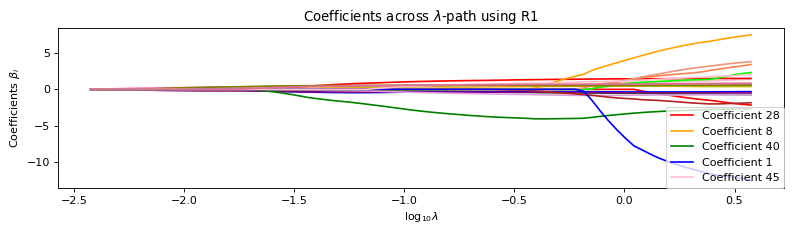

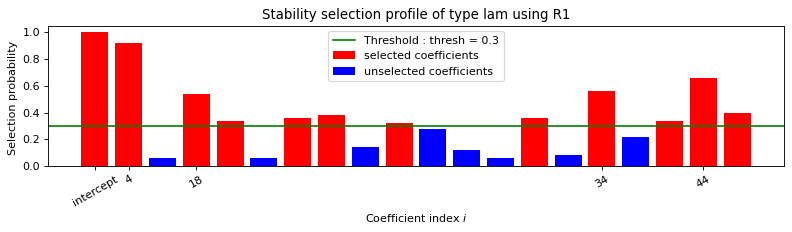

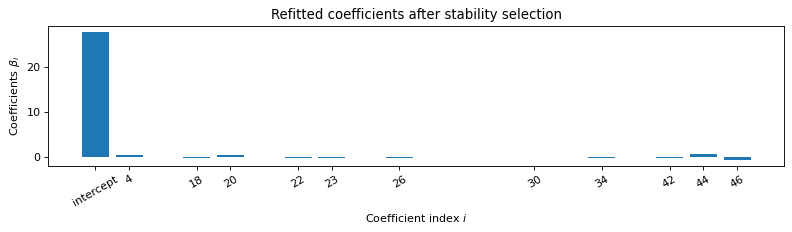


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.012s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    18    20    22    23    26    30    34    42    44    46    
   Running time :  0.079s

[27.83 0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19
 0.00 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 -0.25 0.00 0.70 0.00 -0.53]
6.214842


In [31]:
# SECOND STAGE ESTIMATION
from method_fct import LinearInstrumentModel, noregression_logcontrast

Xreal_n0 = LinearInstrumentModel.add_term_to_zeros(Xreal)
Xreal_ilr = cmp.ilr(Xreal_n0)
betahat, Yhat = noregression_logcontrast(ZZreal, Xreal, Yreal, Xreal_n0, logcontrast_threshold=0.3)
print(betahat)
print(np.mean((Yhat-Yreal)**2))

# Data generation from real parameters



In the following section we will sample from the specific parameter setting. 

We also make additional assumptions on the confounding composition $\mu_c$, the confounder influence on $Y$ called $c_Y$ and the dispersion parameter $c_X$ of the negative binomial distribution.

In [33]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [44]:
from parameter_settings import return_parameter_setting, simulate_data
from types import SimpleNamespace

In [42]:
# set options for data generation
strDim = "p47"
strRel = "negbinom"
strInst = "unknown"

# get parameter setting which is used in the paper
dictReturn = return_parameter_setting(strDim, strRel, strInst,
                                     alpha0_hat, alphaT_hat, ps_hat, betahat)

# generate namespace for parameters
param = SimpleNamespace(**dictReturn)

# print the parameter setting
print(strDim, strRel, strInst)
param

p47 negbinom unknown


namespace(strDim='p47',
          strRel='negbinom',
          strInst='unknown',
          n=1000,
          p=47,
          num_inst=1,
          c_X=0.2,
          alpha0=array([6.23, 0.05, 0.09, 0.00, 144.14, 0.14, 0.05, 0.00, 0.00, 0.00, 0.00,
                        0.00, 0.00, 0.09, 0.82, 8.36, 0.09, 6.27, 28.64, 0.00, 60.27, 1.23,
                        11936.32, 194.09, 0.14, 36.68, 16.32, 27.68, 9.05, 886.14, 288.82,
                        5.68, 1427.73, 0.00, 56.64, 928.73, 0.00, 0.09, 25.36, 0.09, 0.55,
                        0.00, 6.23, 0.00, 141.23, 0.27, 1057.05]),
          alphaT=array([[-2.54, -0.05, -0.06, 0.57, 256.41, 0.58, 59.33, 0.06, 0.03, 0.03,
                         0.17, 0.06, 0.20, -0.09, 0.81, 19.55, -0.06, -3.07, 0.85, 0.09,
                         4.44, 1.09, -3452.72, -59.81, -0.14, -36.17, 2.80, 15.09, -8.70,
                         -267.22, 40.52, -0.08, 646.36, 0.49, 6.74, 139.02, 0.03, -0.09,
                         33.75, 0.14, -0.52, 0.26, 

In [45]:
confounder, Z_sim, X_sim, Y_sim, X_star, Y_star = simulate_data(dictReturn)

X_sim_ilr = cmp.ilr(X_sim)
X_star_ilr = cmp.ilr(X_star)

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



In [48]:
X_plot = np.hstack([X_sim[:, X_sim.mean(axis=0)>0.03], X_sim[:, X_sim.mean(axis=0)<0.03].sum(axis=1).T[..., np.newaxis]])
fig = px.bar(pd.DataFrame(X_plot[:100, :], columns=["Microbe "+str(i) for i in range(X_plot.shape[1]-1)] + ["Other"]))
fig = update_layout_px(fig)
fig.update_xaxes(title="Sample number")
fig.update_yaxes(title="Percentage of microbiota in sample")
fig.show()

In [49]:
# Compute F-Statistics 
ZZ_sim = onp.array(sm.add_constant(Z_sim))
alphahat = np.linalg.inv(ZZ_sim.T@ZZ_sim)@ZZ_sim.T@X_sim_ilr
MSM = np.sum(((ZZ_sim@alphahat - np.mean(X_sim_ilr, axis=0))**2), axis=0)/(num_inst)
MSE = np.sum(((ZZ_sim@alphahat - X_sim_ilr)**2), axis=0)/(n-num_inst)
F = MSM / MSE
F

DeviceArray([0.00, 38.45, 40.55, 0.30, 0.30, 0.30, 0.30, 0.30, 0.30, 0.30,
             0.30, 0.30, 0.30, 0.30, 0.30, 0.30, 0.30, 0.30, 0.30, 0.30,
             0.30, 57.44, 3.34, 20.89, 20.89, 20.89, 20.89, 20.89, 16.33,
             0.53, 20.24, 4.63, 11.72, 11.72, 1.38, 8.29, 8.29, 8.29,
             8.29, 8.29, 8.29, 8.29, 8.29, 0.00, 7.19, 149.06],            dtype=float32)

In [51]:
fig = plot_ilr_X_vs_Y(X_sim_ilr, X_star_ilr, Y_sim, Y_star)

fig.update_layout(xaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(width=2000, height=500)
fig.show()

**************************************************************************************************
*****************************************We are at 0 of 20***********************************************
**************************************************************************************************


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.10 0.15 0.01 0.01 0.01 0.01 0.01
 -0.04 -0.14 0.01 -0.05 0.01 0.01 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.71 0.03 0.52]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.10 -0.15
 -0.01 -0.01 -0.01 -0.01 -0.01 0.03 0.13 -0.01 0.05 -0.01 -0.01 -0.02
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.71 -0.01 -0.52]

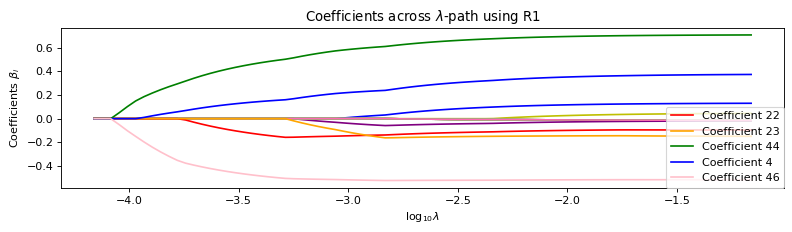

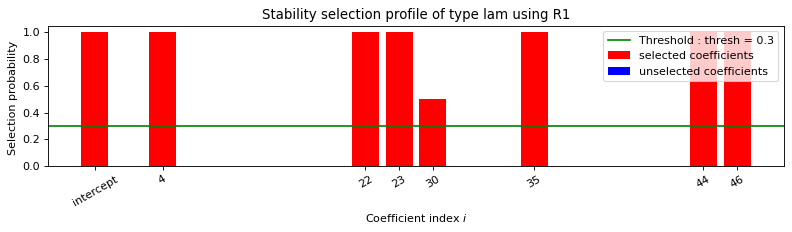

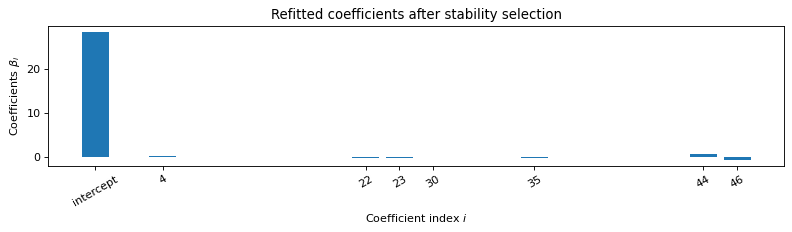


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.01s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.078s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.26 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.10 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.67 0.00 -0.54]
Error: 0.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------------

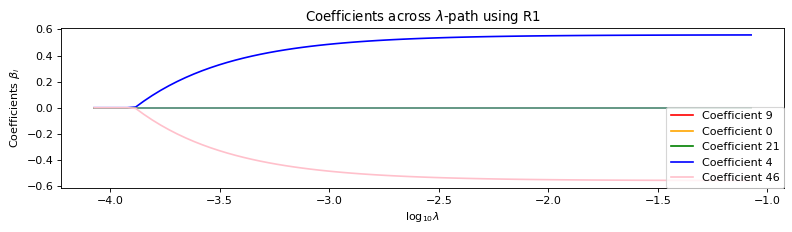

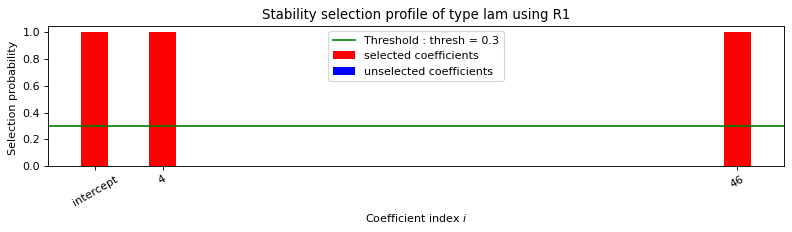

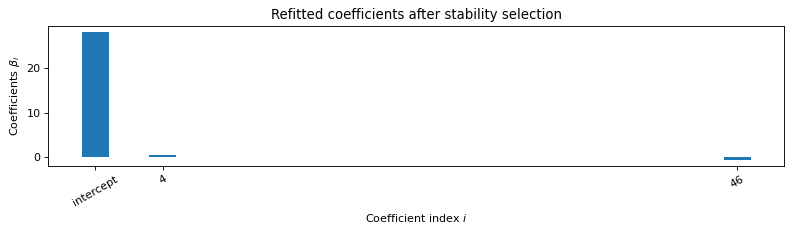


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 4.56

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


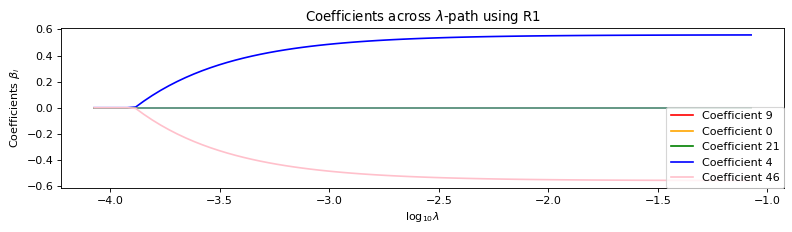

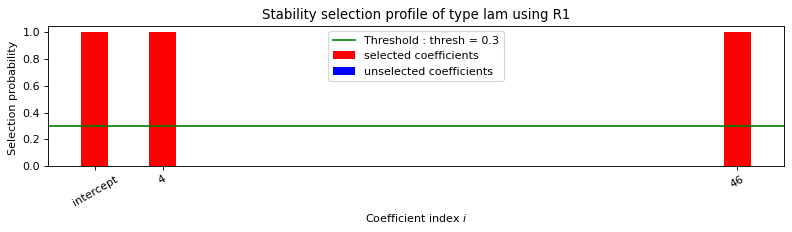

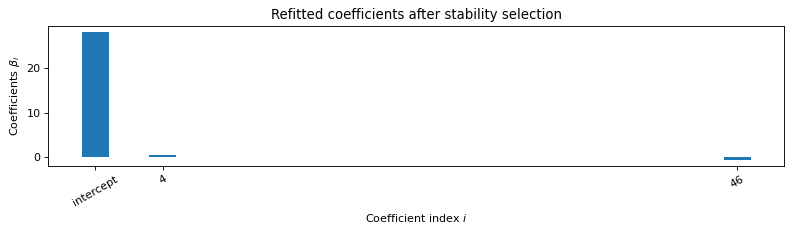


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.06s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.50 0.10 0.09 0.07 0.07 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.57]
Error: 4.56

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Setup matrices...
INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.63]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.22

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.26

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -69667.016
Model:                         IV2SLS   Adj. R-squared:             -73029.796
Method:                     Two Stage   F-statistic:                -4.640e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        10:58:42                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         89.5750        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.09 0.13 0.01 0.01 0.01 0.01 0.01
 -0.03 -0.14 0.01 -0.04 0.01 0.01 0.00 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.68 0.03 0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.13
 -0.01 -0.01 -0.01 -0.01 -0.01 0.03 0.14 -0.01 0.04 -0.01 -0.01 0.00 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.68 -0.01 -0.53]


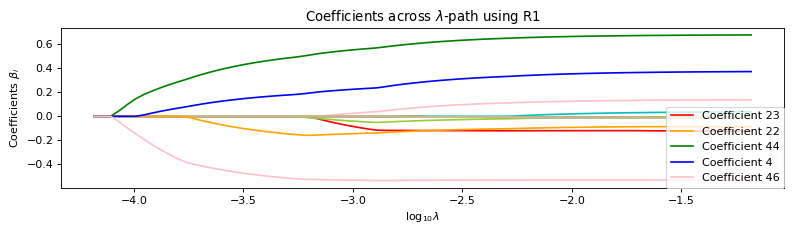

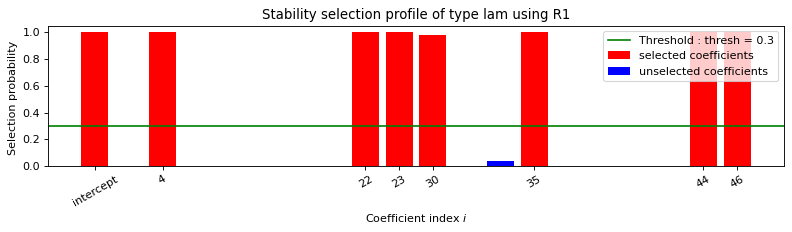

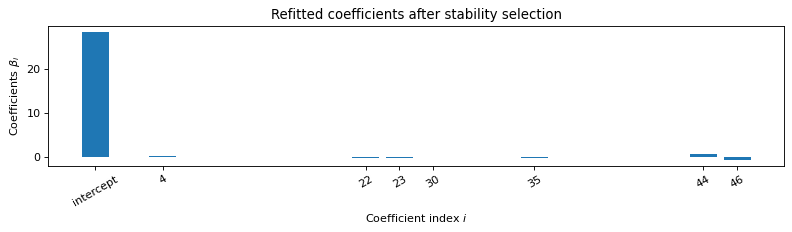


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.105s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.23 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.63 0.00 -0.55]
Error: 0.22

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

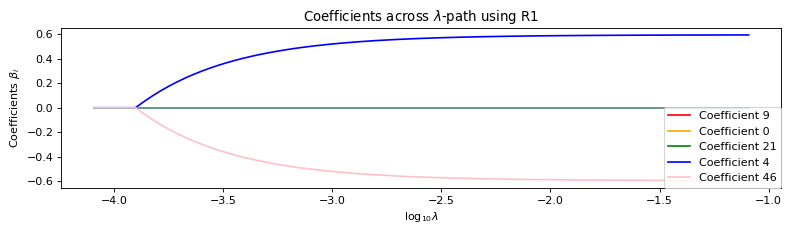

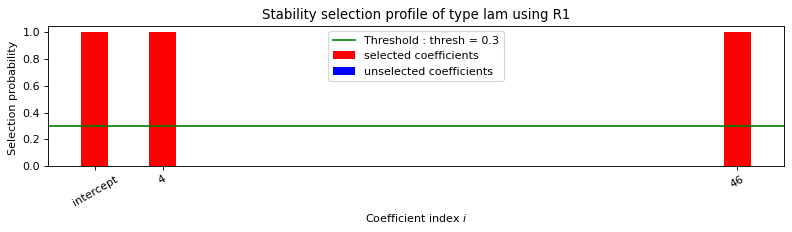

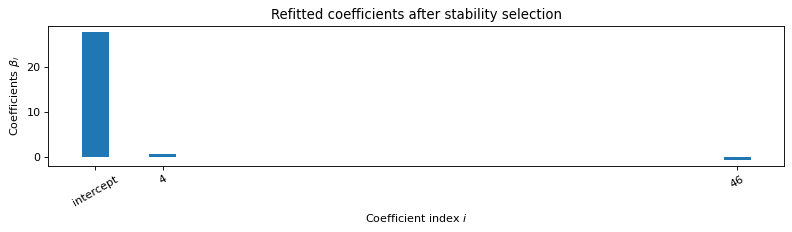


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.059s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 4.84

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


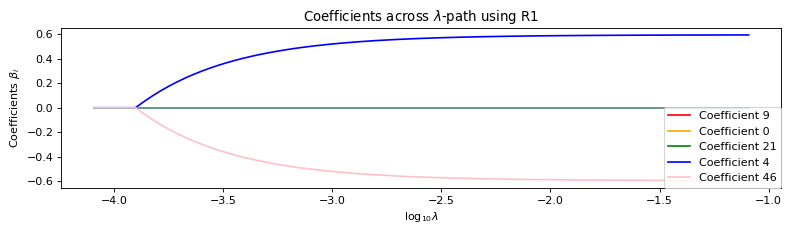

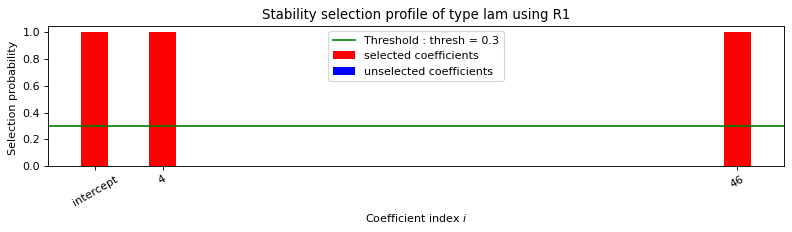

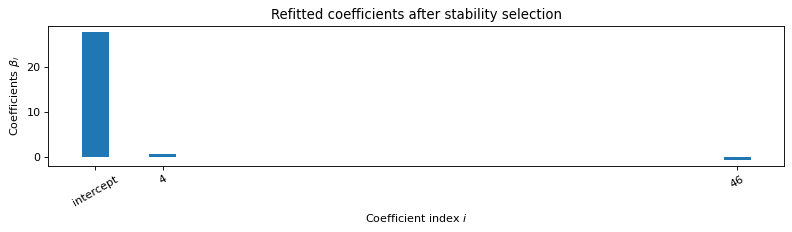

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.069s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 4.84

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [-3.96]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.71

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -212068.172
Model:                         IV2SLS   Adj. R-squared:            -222304.459
Method:                     Two Stage   F-statistic:                -2.124e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:01:22                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.0326        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.11 0.12 0.01 0.01 0.01 0.01 0.01
 -0.06 -0.15 0.01 -0.04 0.01 0.01 0.00 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.67 0.03 0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.36 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.12
 -0.01 -0.01 -0.01 -0.01 -0.01 0.05 0.15 -0.01 0.04 -0.01 -0.01 0.00 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.68 -0.01 -0.53]


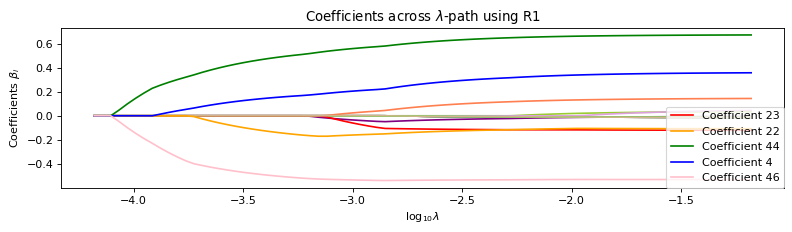

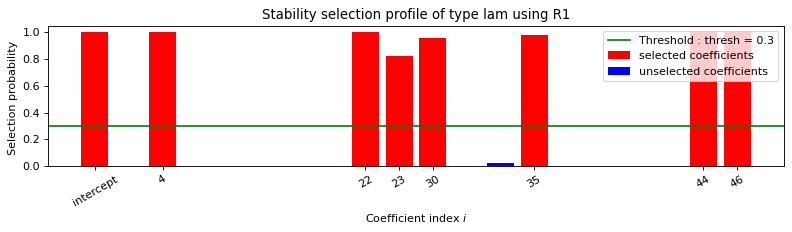

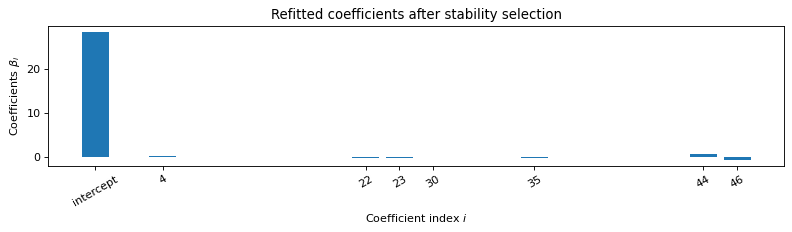


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.098s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.26 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.22 0.00 0.00 0.00 0.00
 0.00 0.00 0.09 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.63 0.00 -0.55]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

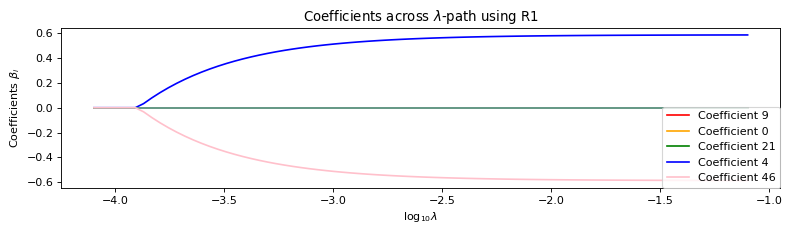

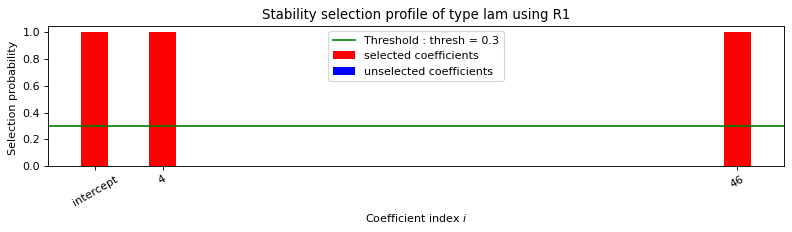

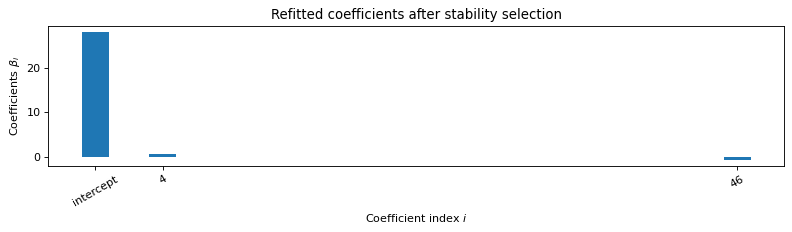


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.06s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 4.27

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


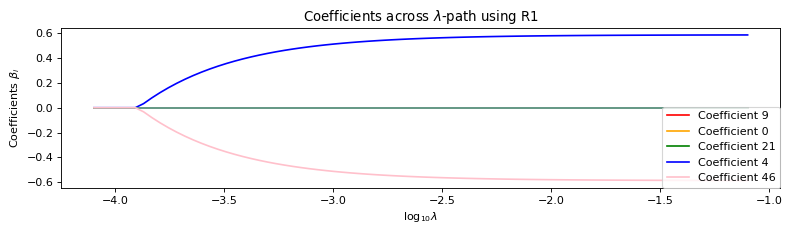

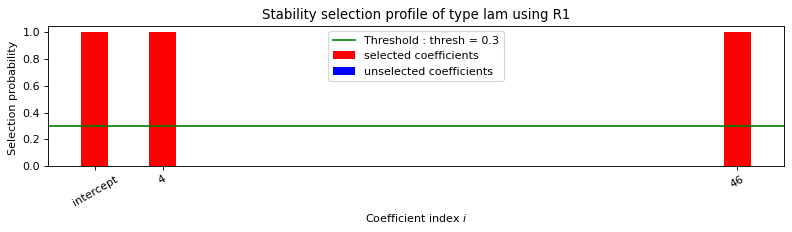

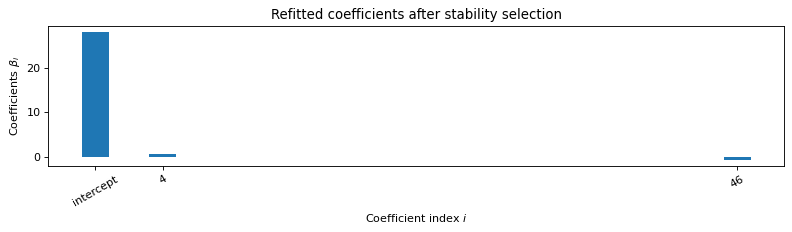

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.59]
Error: 4.27

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-11.17]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.33

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.05

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 10.71

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -2779.335
Model:                         IV2SLS   Adj. R-squared:              -2913.538
Method:                     Two Stage   F-statistic:                 2.326e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:04:03                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.9181        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.10 0.13 0.01 0.01 0.01 0.01 0.01
 -0.04 -0.14 0.01 -0.03 0.01 0.01 0.00 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.68 0.02 0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.10 -0.14
 -0.01 -0.01 -0.01 -0.01 -0.01 0.03 0.14 -0.01 0.03 -0.01 -0.01 0.00 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.69 -0.01 -0.53]


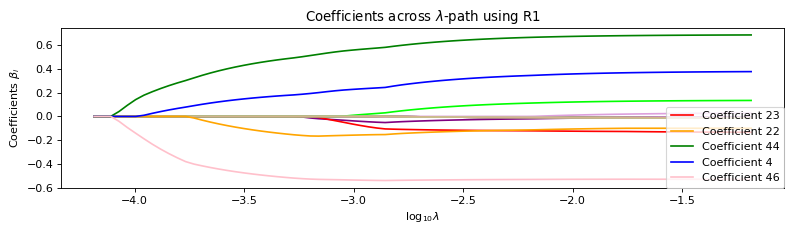

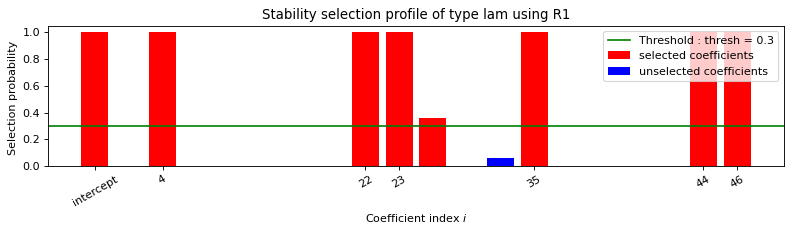

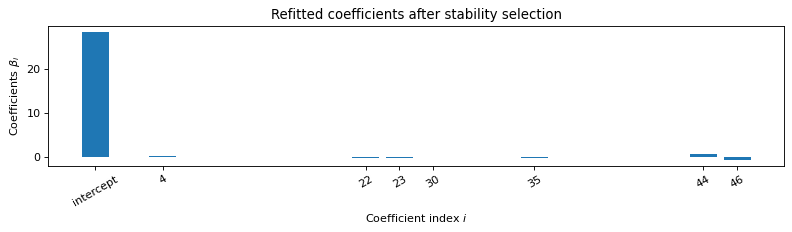


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.105s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.22 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.63 0.00 -0.55]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

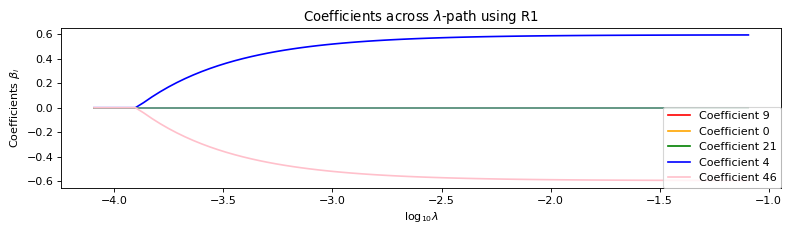

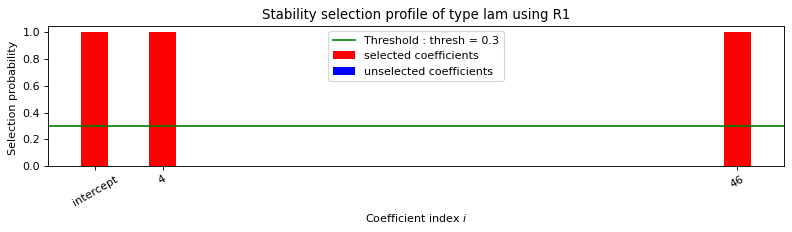

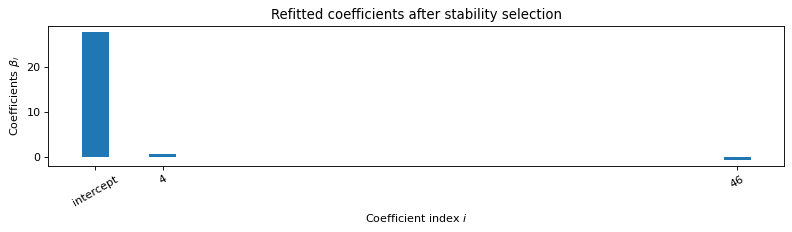


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.08s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.60 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.60]
Error: 4.57

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


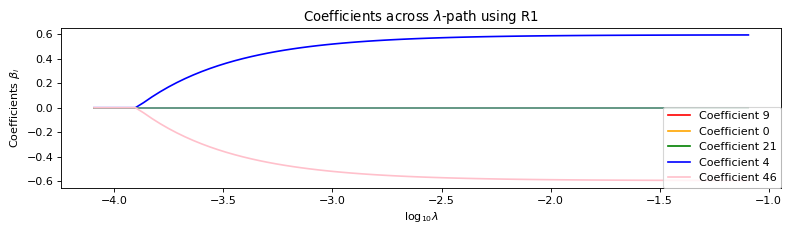

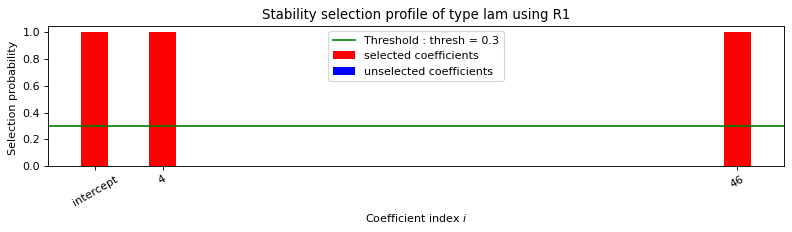

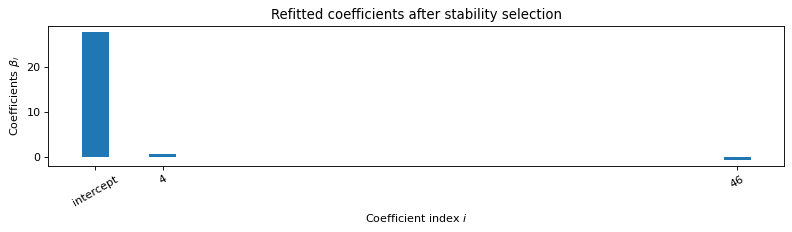

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 4.57

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.57]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 5.63

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.31

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:               -30383220.758
Model:                         IV2SLS   Adj. R-squared:          -31849777.107
Method:                     Two Stage   F-statistic:                 1.117e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:06:45                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -14.8018        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.09 0.14 0.01 0.01 0.01 0.01 0.01
 -0.04 -0.15 0.01 -0.05 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.03 0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.08 -0.15
 -0.01 -0.01 -0.01 -0.01 -0.01 0.03 0.14 -0.01 0.05 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.70 -0.01 -0.53]

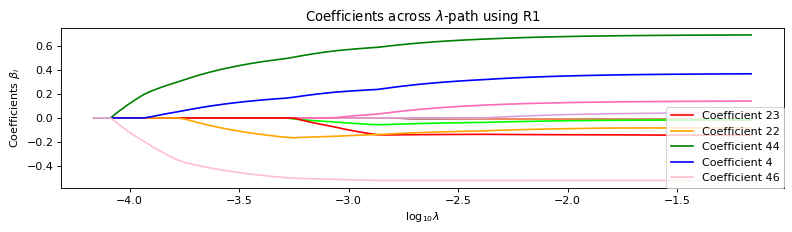

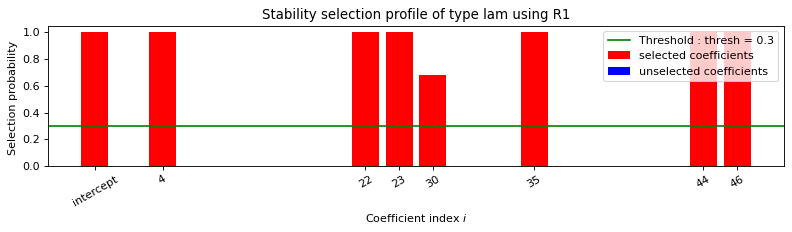

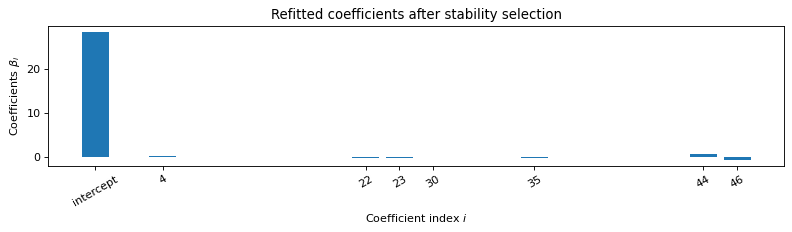


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.118s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.26 0.00 0.00 0.00 0.00
 0.00 0.00 0.09 0.00 0.00 0.00 0.00 -0.10 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.64 0.00 -0.54]
Error: 0.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

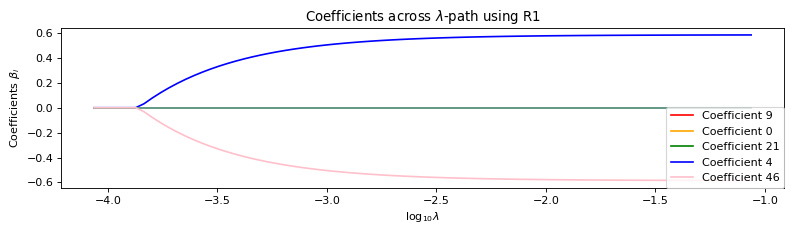

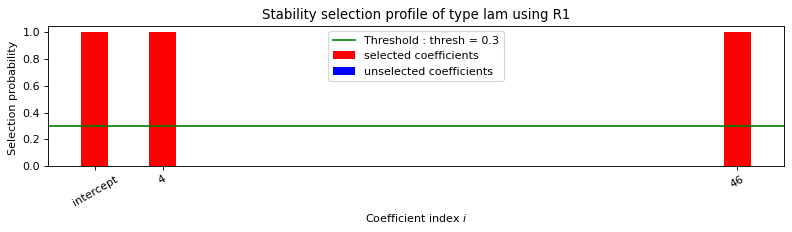

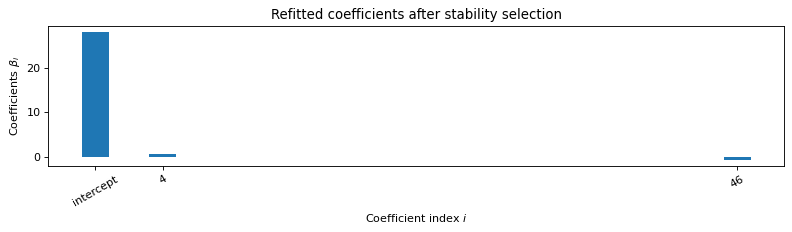


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.077s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 4.85

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


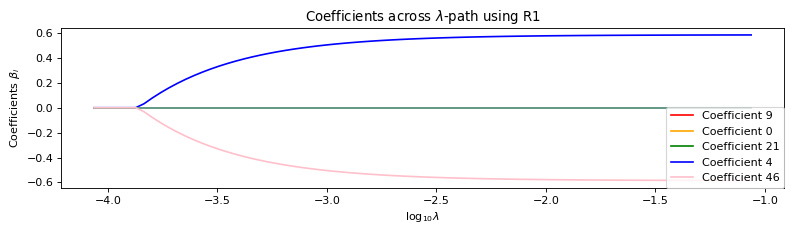

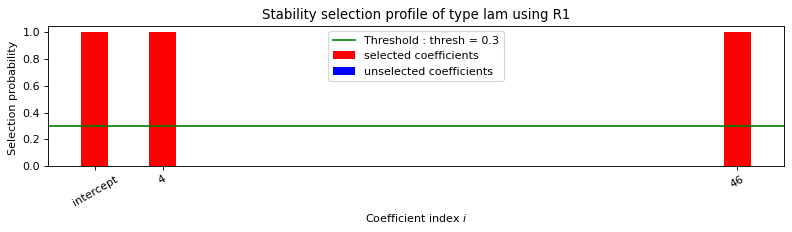

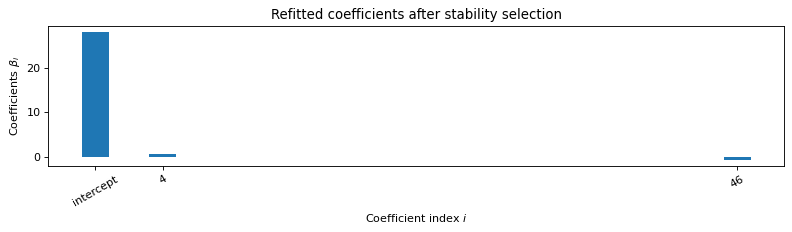

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.078s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.52 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.59]
Error: 4.85

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-3.41]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.81

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.86

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -1469591.499
Model:                         IV2SLS   Adj. R-squared:           -1540526.709
Method:                     Two Stage   F-statistic:                -1.708e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:09:56                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.8214        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.33 0.07 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.10 0.15 0.01 0.01 0.01 0.01 0.00
 -0.05 -0.13 0.01 -0.03 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.02 0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.36 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.10 -0.16
 -0.01 -0.01 -0.01 -0.01 -0.01 0.04 0.13 -0.01 0.03 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.69 -0.01 -0.53]

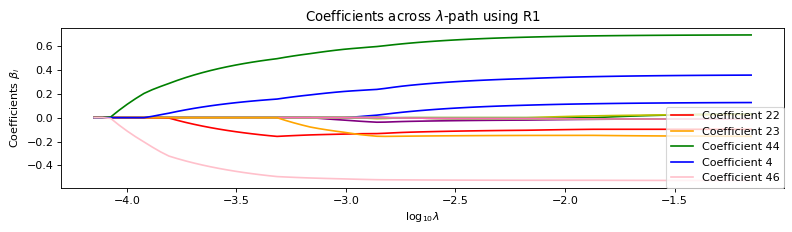

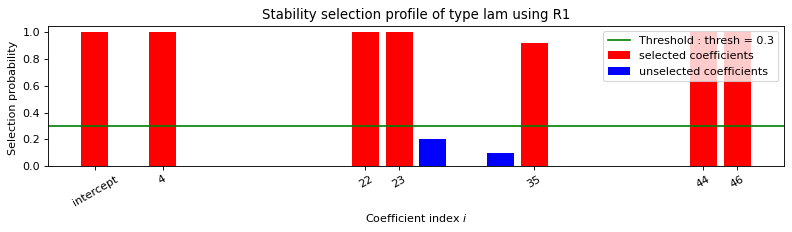

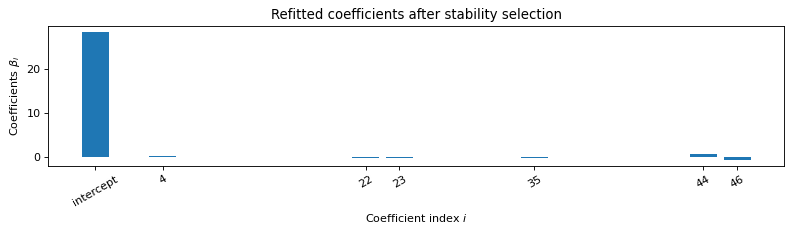


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    35    44    46    
   Running time :  0.11s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.29 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.22 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.07 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.66 0.00 -0.53]
Error: 0.21

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------------------

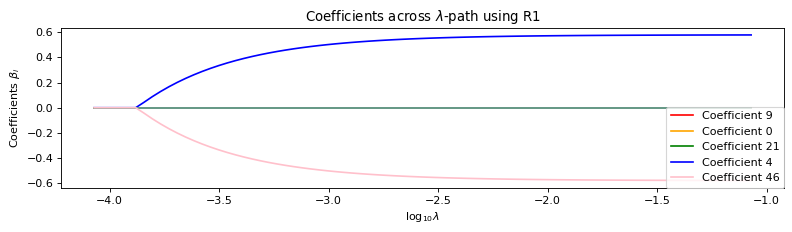

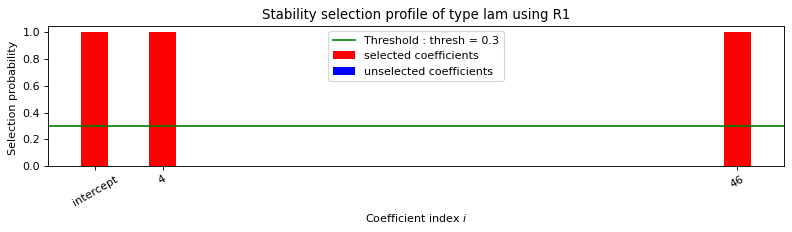

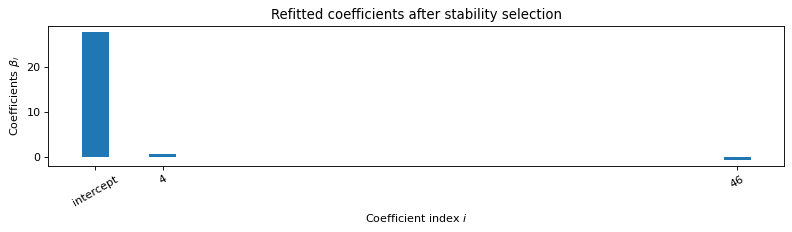


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.073s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 4.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


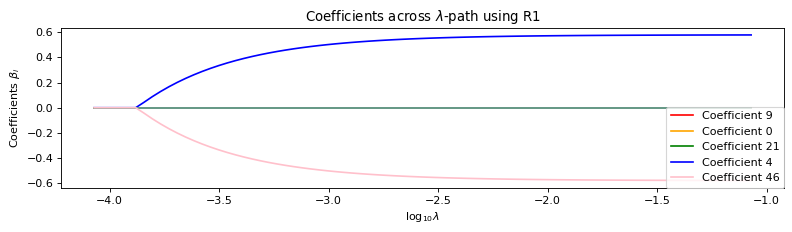

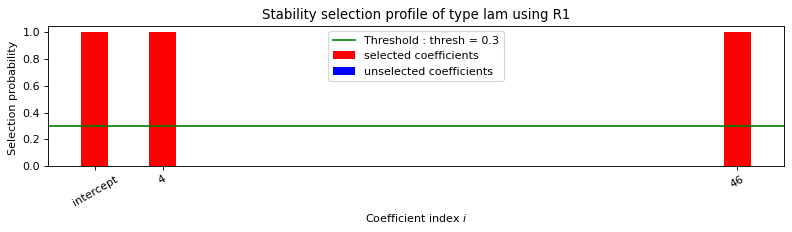

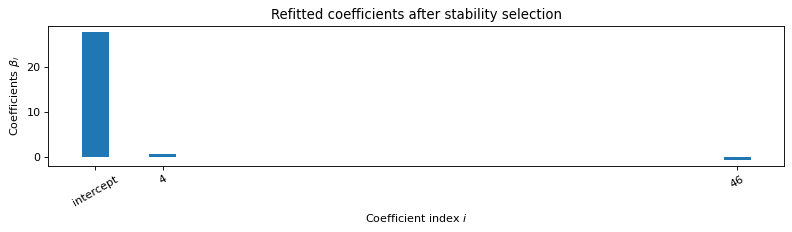

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.084s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.52 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.59]
Error: 4.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.66]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 5.95

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.29

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -122654.041
Model:                         IV2SLS   Adj. R-squared:            -128574.432
Method:                     Two Stage   F-statistic:                 1.926e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:13:14                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.2911   3.99e+08   2.33e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.12 0.10 0.01 0.01 0.01 0.01 0.01
 -0.03 -0.14 0.01 -0.04 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.03 0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.10
 -0.01 -0.01 -0.01 -0.01 -0.01 0.02 0.13 -0.01 0.04 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.70 -0.01 -0.53]

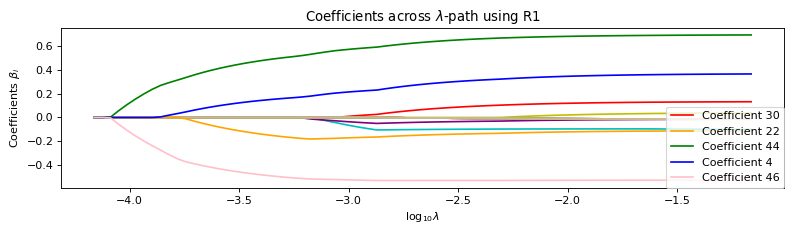

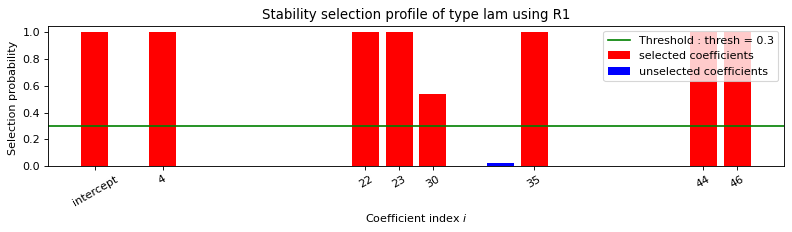

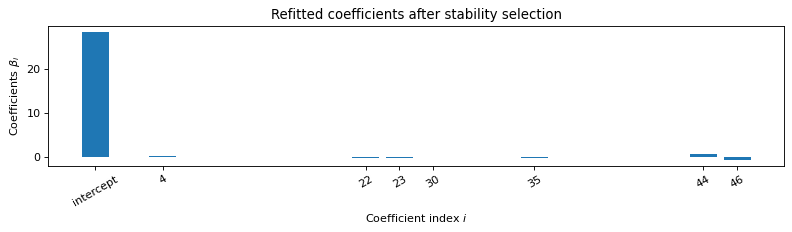


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.113s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.22 0.00 0.00 0.00 0.00
 0.00 0.00 0.07 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.65 0.00 -0.55]
Error: 0.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

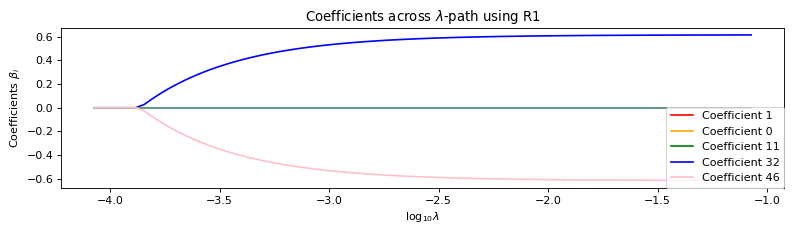

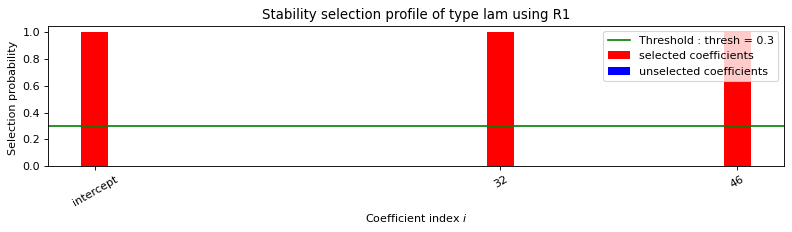

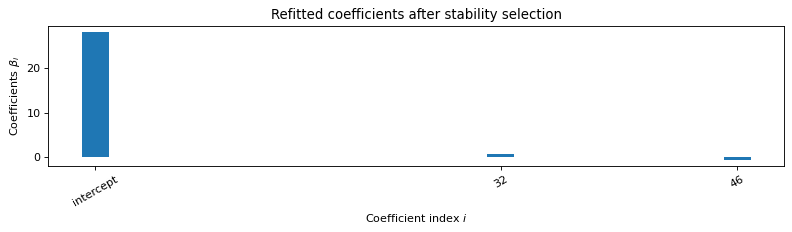


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.069s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.62 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.62]
Error: 8.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


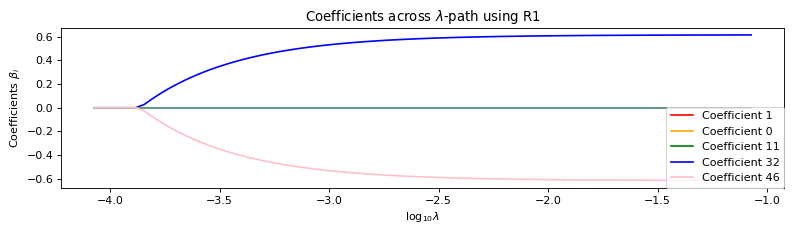

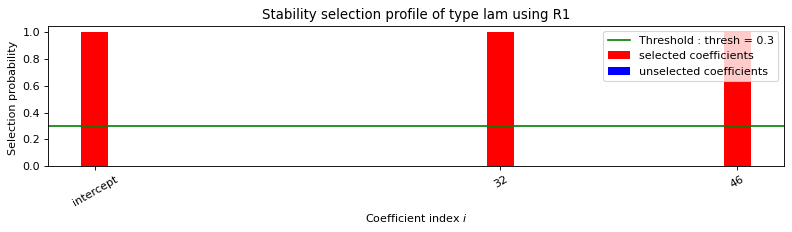

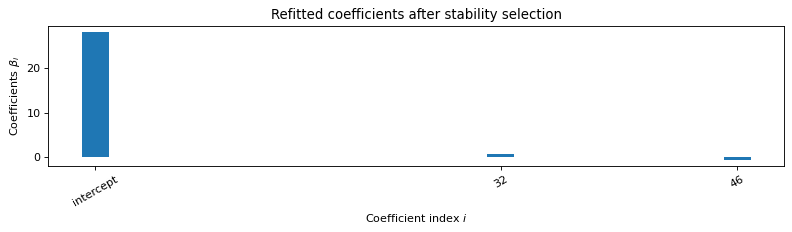

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.074s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.61 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01
 0.01 0.01 0.01 0.62]
Error: 8.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.23]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 7.67

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 10.4

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -618481.742
Model:                         IV2SLS   Adj. R-squared:            -648335.054
Method:                     Two Stage   F-statistic:                -1.601e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:16:13                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -164.1830        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.11 0.16 0.01 0.01 0.01 0.01 0.01
 -0.05 -0.15 0.01 -0.03 0.01 0.01 0.00 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.70 0.02 0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.16
 -0.01 -0.01 -0.01 -0.01 -0.01 0.05 0.15 -0.01 0.03 -0.01 -0.01 0.00 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.70 -0.01 -0.53]


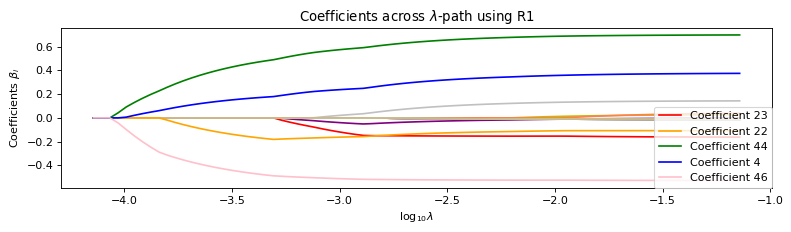

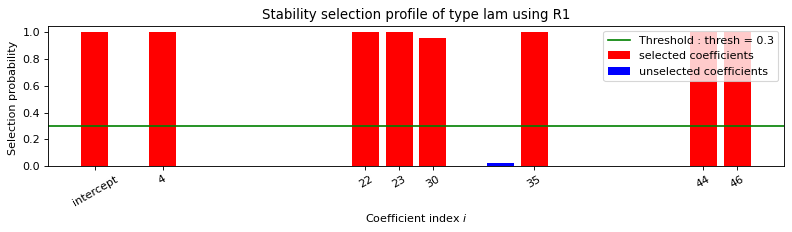

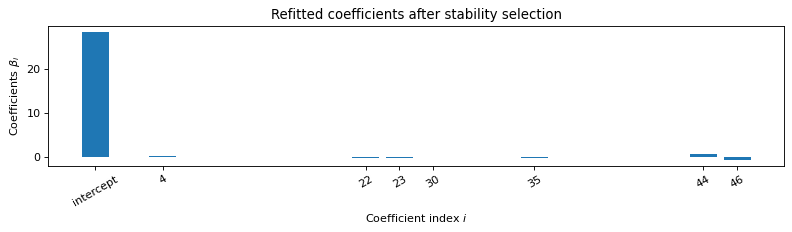


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.119s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.29 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.25 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.65 0.00 -0.54]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

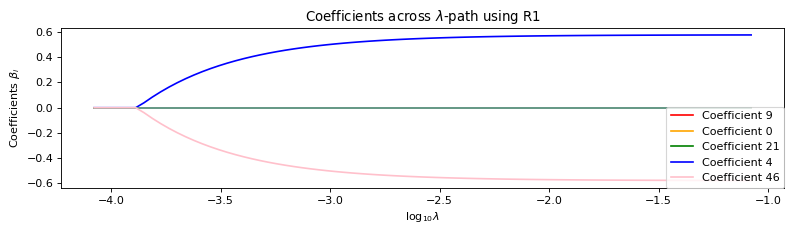

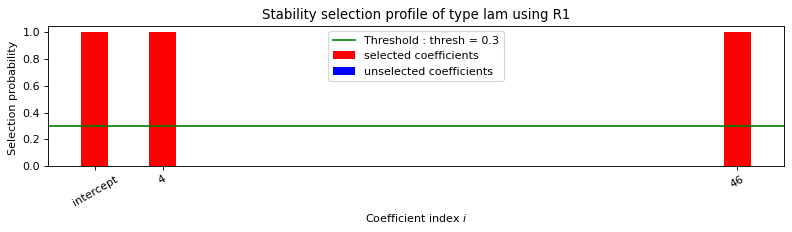

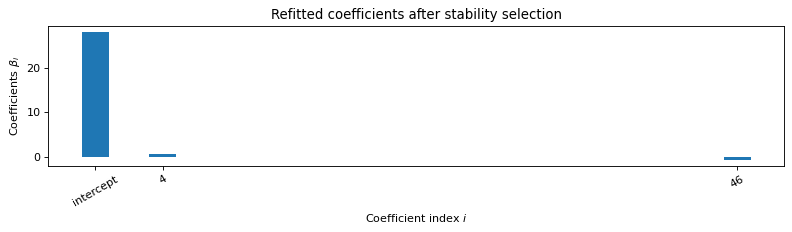


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.107s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.151s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 4.49

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


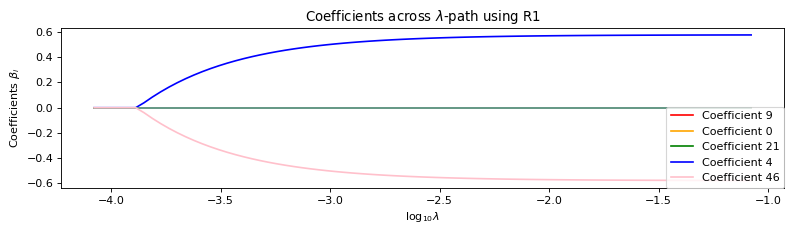

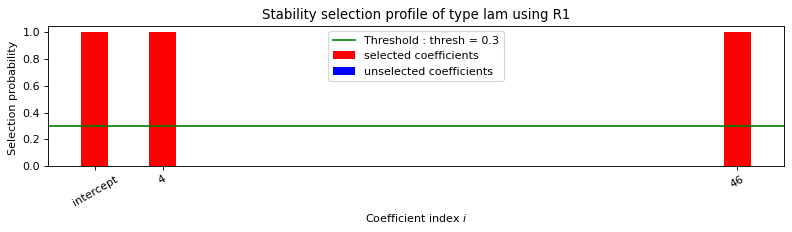

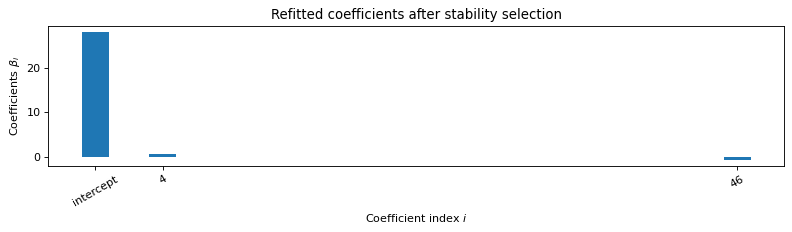

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.08s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.52 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 4.49

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-11.00]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.87

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.12

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -437536.984
Model:                         IV2SLS   Adj. R-squared:            -458656.341
Method:                     Two Stage   F-statistic:                 2.988e-13
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:20:41                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        147.3896        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.10 0.12 0.01 0.01 0.01 0.01 0.01
 -0.05 -0.14 0.01 -0.03 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.03 0.55]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.10 -0.13
 -0.01 -0.01 -0.01 -0.01 -0.01 0.04 0.14 -0.01 0.03 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.70 -0.01 -0.54]

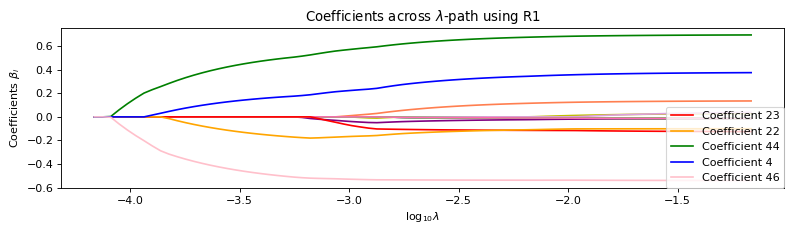

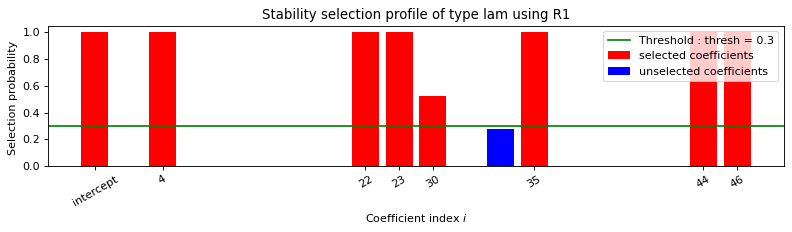

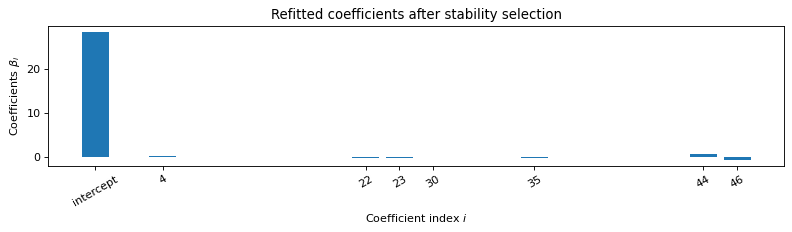


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.11s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.23 0.00 0.00 0.00 0.00
 0.00 0.00 0.07 0.00 0.00 0.00 0.00 -0.10 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.65 0.00 -0.55]
Error: 0.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------------

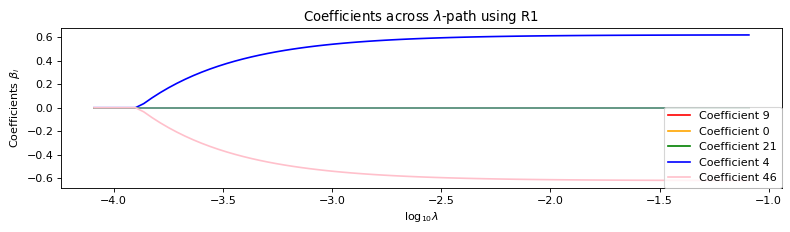

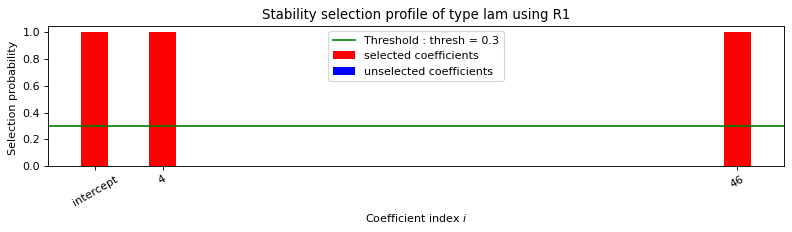

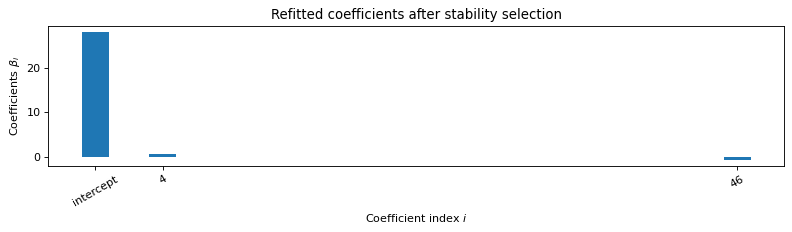


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.105s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.62 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.62]
Error: 4.88

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


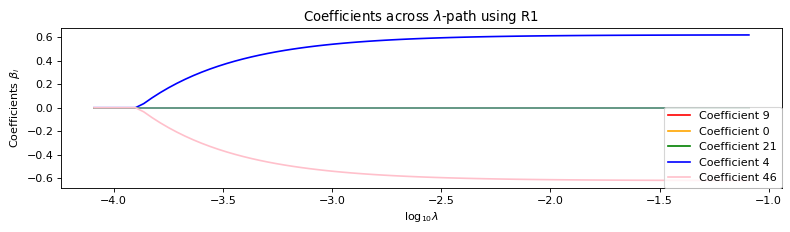

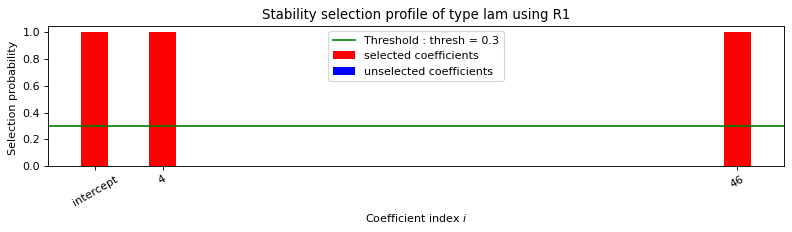

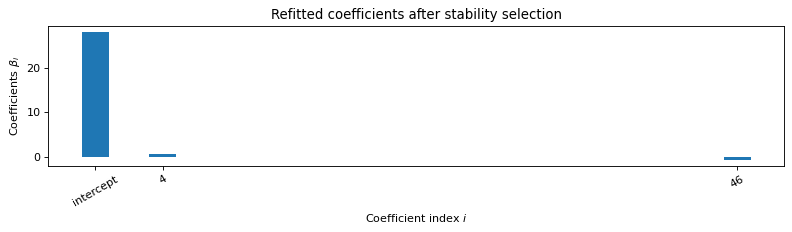

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.066s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.56 0.11 0.10 0.08 0.07 0.07 0.06 0.05 0.05 0.05 0.04
 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01
 0.01 0.01 0.01 0.63]
Error: 4.88

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.71]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.69

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.63

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -54305.152
Model:                         IV2SLS   Adj. R-squared:             -56926.436
Method:                     Two Stage   F-statistic:                 2.004e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:24:45                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -20.1151        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.36 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.08 0.15 0.01 0.01 0.01 0.01 0.01
 -0.05 -0.15 0.01 -0.06 0.01 0.01 0.00 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.71 0.03 0.53]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.39 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.08 -0.15
 -0.02 -0.02 -0.02 -0.02 -0.02 0.04 0.15 -0.02 0.06 -0.02 -0.02 0.00 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.71 -0.02 -0.52]


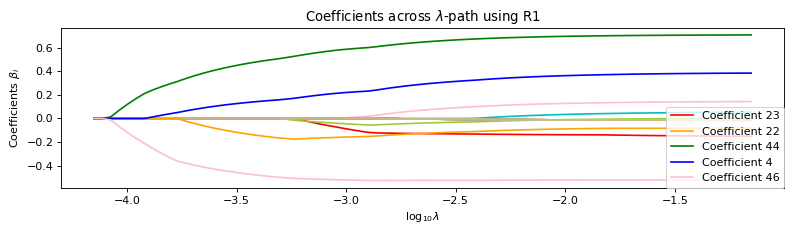

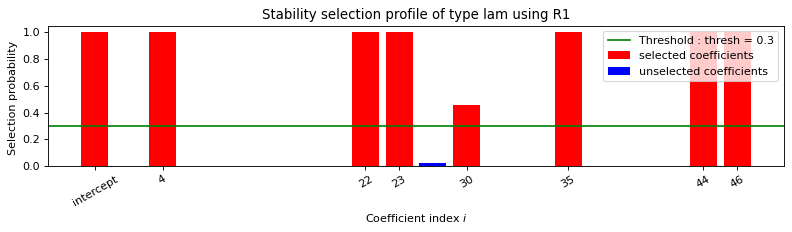

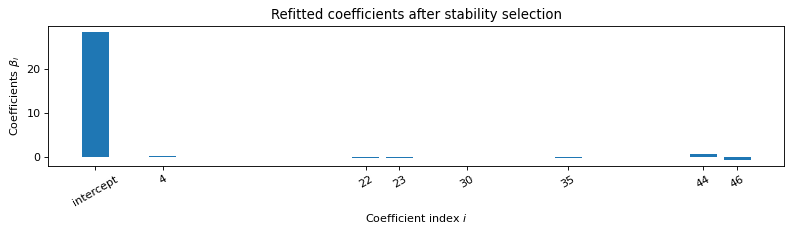


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.213s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.185s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.23 0.00 0.00 0.00 0.00
 0.00 0.00 0.07 0.00 0.00 0.00 0.00 -0.10 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.66 0.00 -0.54]
Error: 0.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

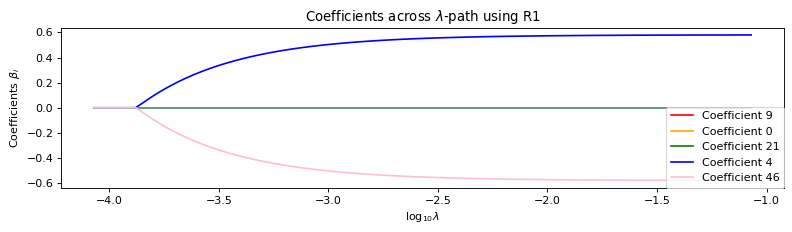

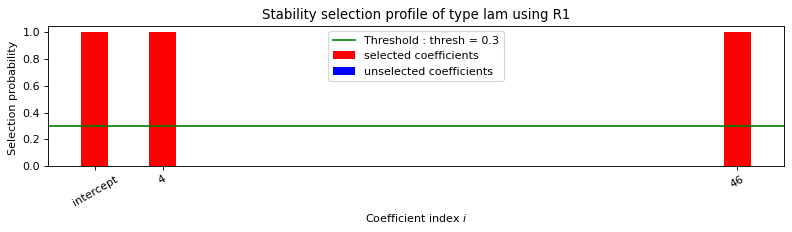

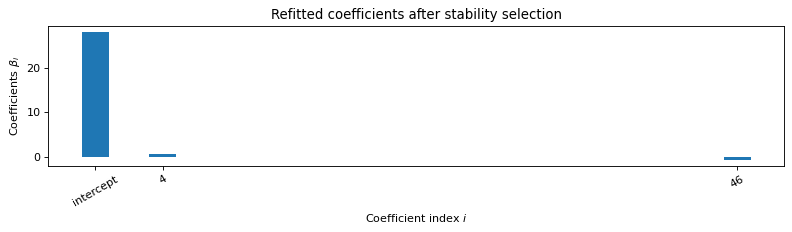


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.071s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 4.78

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


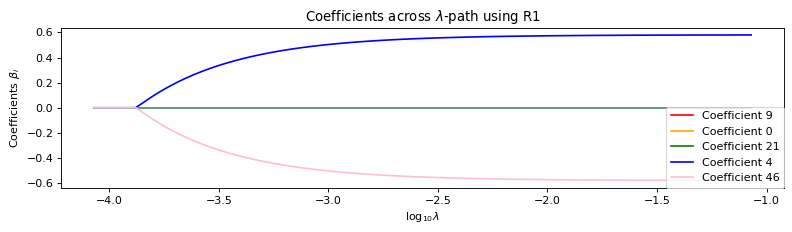

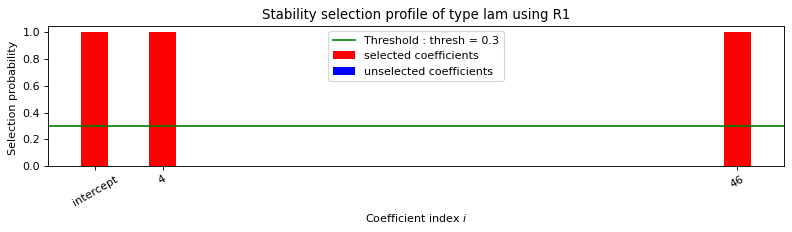

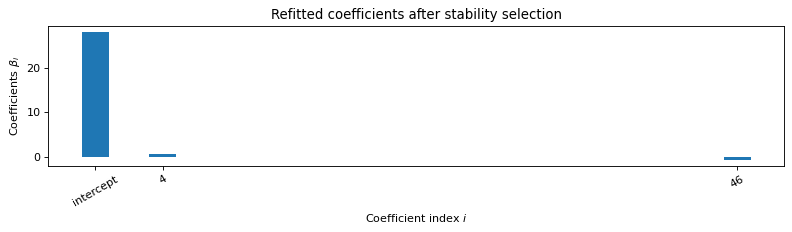

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.52 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.59]
Error: 4.78

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [-10.33]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.91

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.05

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 10.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -5771.161
Model:                         IV2SLS   Adj. R-squared:              -6049.775
Method:                     Two Stage   F-statistic:                -2.302e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:29:35                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -39.3092        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.13 0.13 0.01 0.01 0.01 0.01 0.01
 -0.05 -0.14 0.01 -0.04 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.70 0.03 0.52]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.13 -0.13
 -0.01 -0.01 -0.01 -0.01 -0.01 0.04 0.13 -0.01 0.04 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.71 -0.01 -0.52]

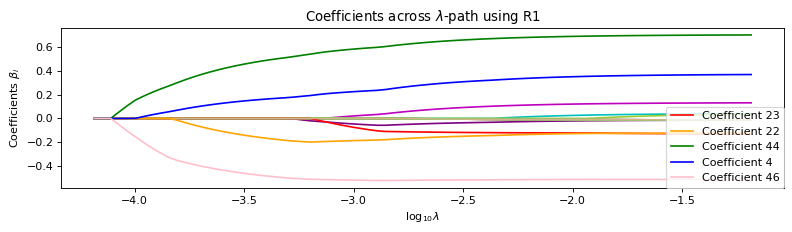

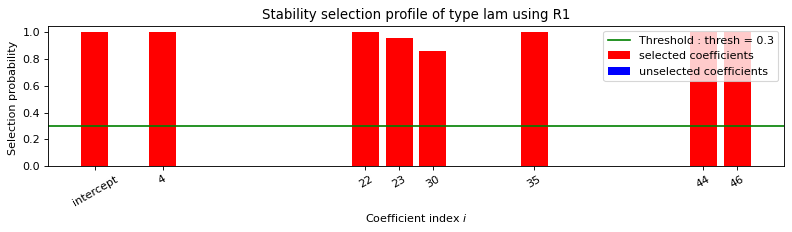

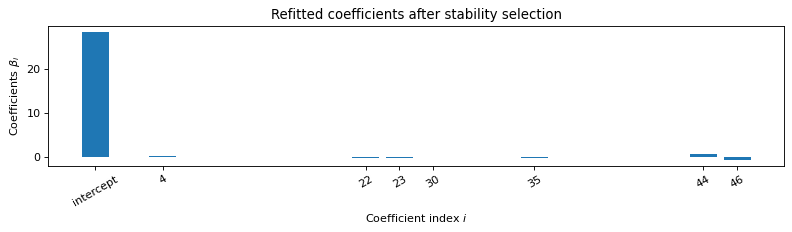


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.176s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.17 -0.21 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.10 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.66 0.00 -0.54]
Error: 0.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------------

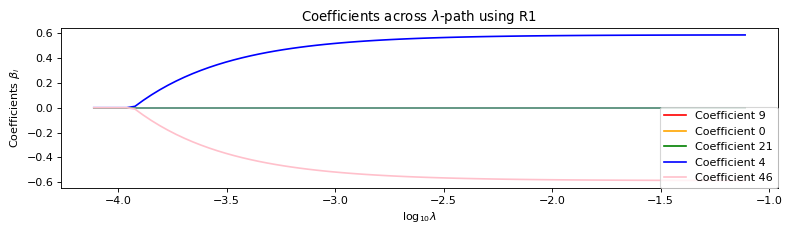

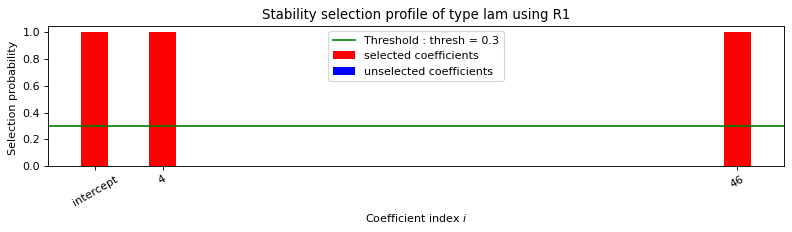

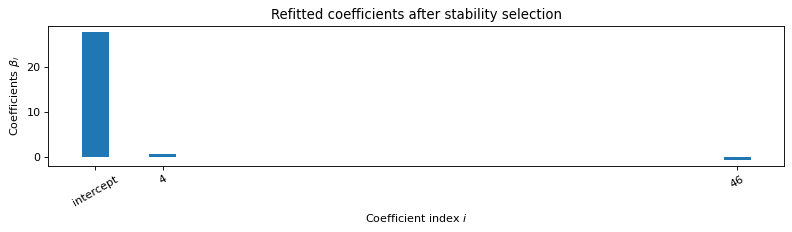


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.087s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 4.49

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


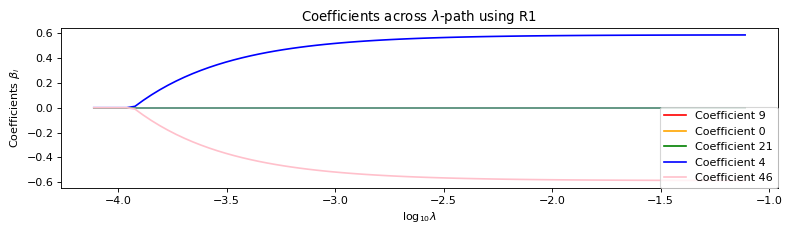

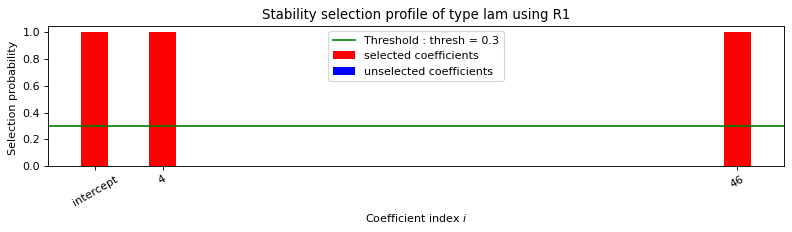

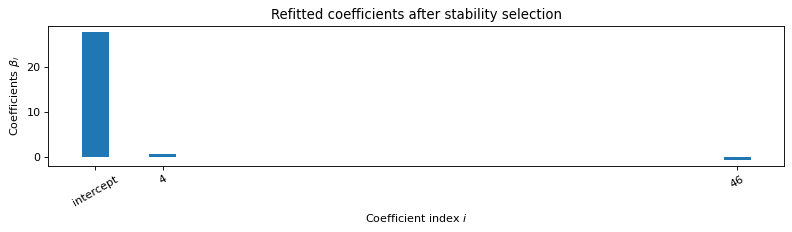

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.068s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.59]
Error: 4.49

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.81]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 5.59

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.05

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.36

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -285860.739
Model:                         IV2SLS   Adj. R-squared:            -299658.892
Method:                     Two Stage   F-statistic:                -4.627e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:33:57                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.9100   1.67e+10   5.34e-10      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.09 0.16 0.01 0.01 0.01 0.01 0.01
 -0.05 -0.14 0.01 -0.03 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.68 0.02 0.52]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.16
 -0.01 -0.01 -0.01 -0.01 -0.01 0.05 0.14 -0.01 0.03 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.68 -0.01 -0.52]

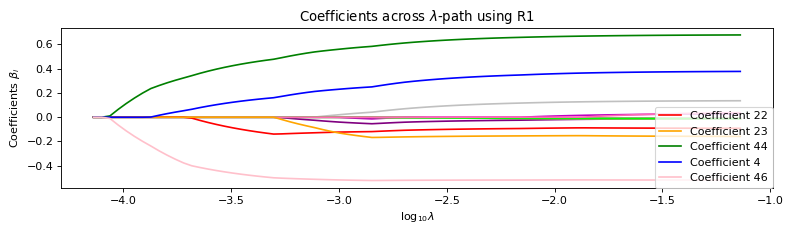

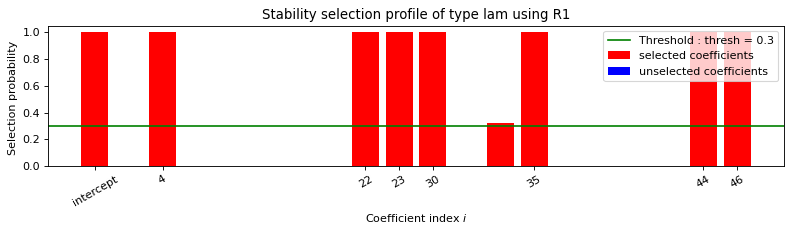

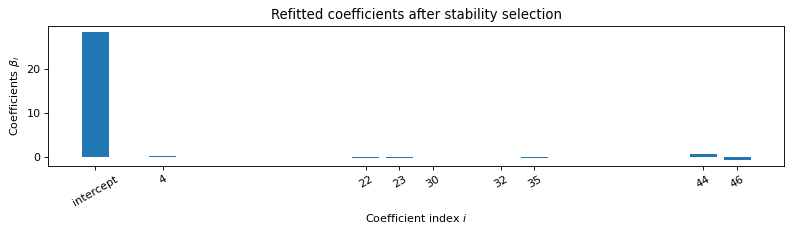


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.12s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.30 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.11 -0.25 0.00 0.00 0.00 0.00
 0.00 0.00 0.09 0.00 -0.04 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.64 0.00 -0.53]
Error: 0.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------

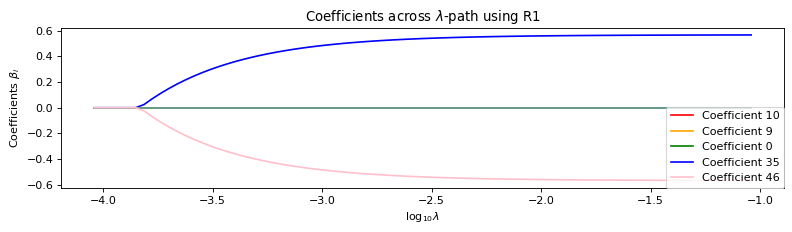

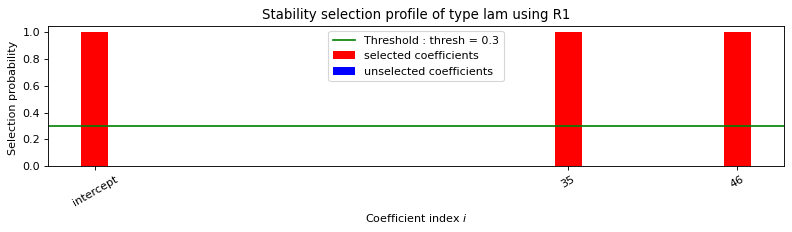

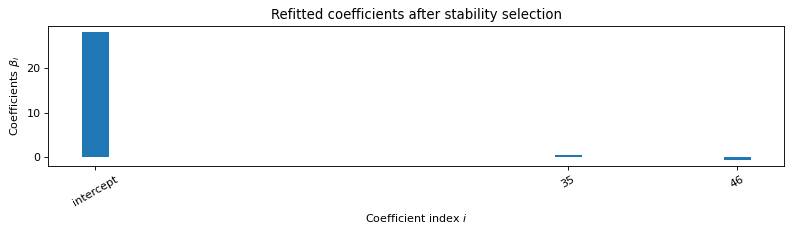


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    35    46    
   Running time :  0.059s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.57 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.57]
Error: 8.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


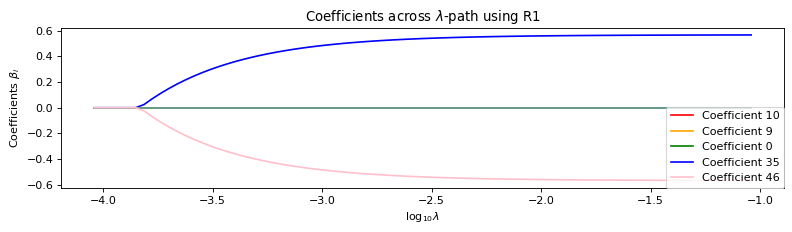

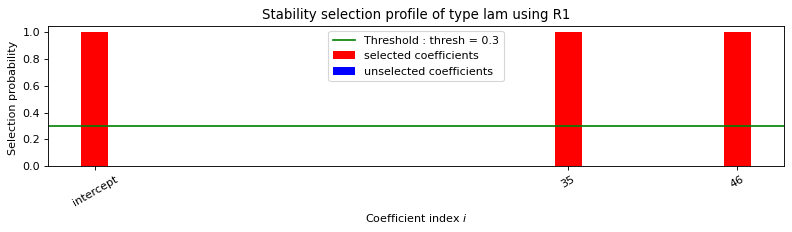

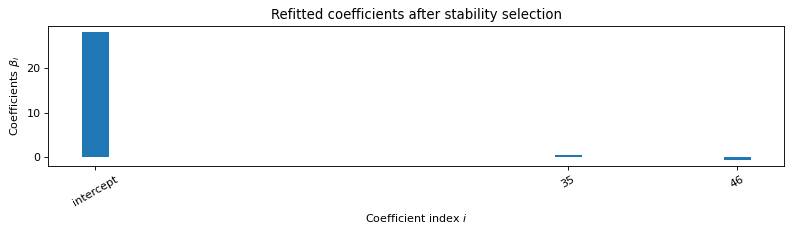

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    35    46    
   Running time :  0.068s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 -0.56 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.57]
Error: 8.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-9.44]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.52

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.27

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -8539.038
Model:                         IV2SLS   Adj. R-squared:              -8951.254
Method:                     Two Stage   F-statistic:                -3.090e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:36:41                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         33.1581   1.88e+09   1.76e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.33 0.07 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.10 0.14 0.01 0.01 0.01 0.01 0.01
 -0.04 -0.13 0.01 -0.03 0.01 0.01 0.00 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.70 0.02 0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.36 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.10 -0.15
 -0.01 -0.01 -0.01 -0.01 -0.01 0.03 0.13 -0.01 0.03 -0.01 -0.01 0.00 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.70 -0.01 -0.53]


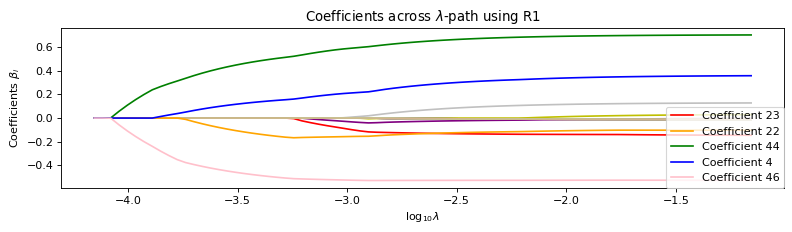

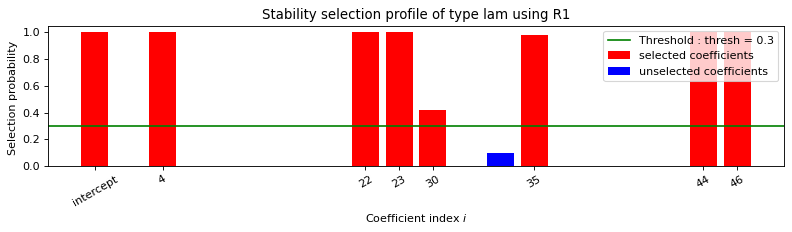

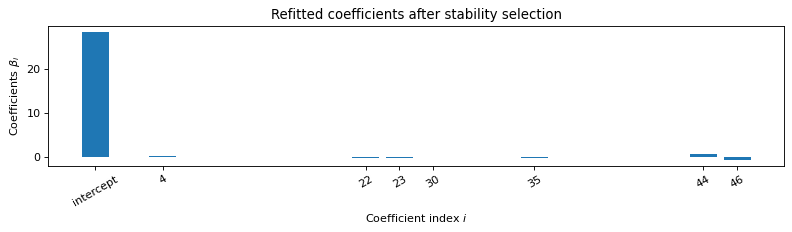


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.096s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.27 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.23 0.00 0.00 0.00 0.00
 0.00 0.00 0.07 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.66 0.00 -0.54]
Error: 0.21

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

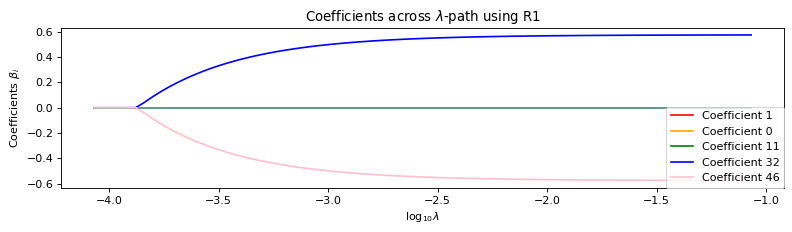

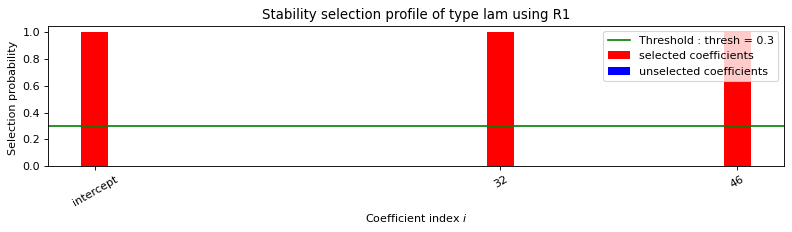

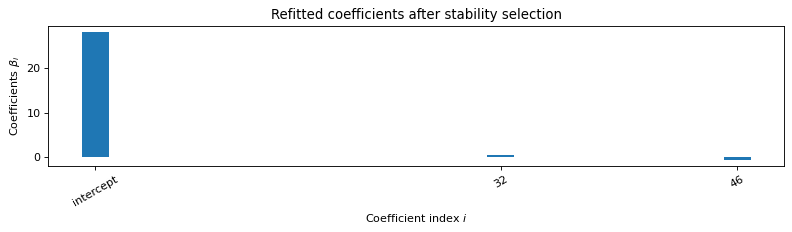


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 8.39

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


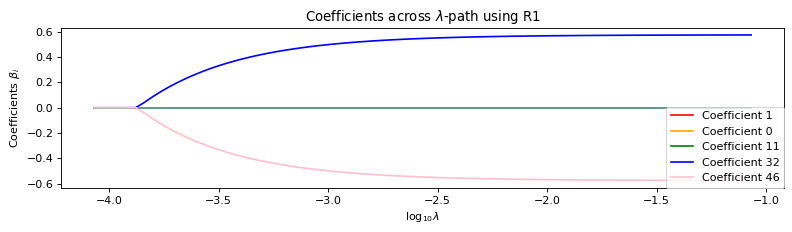

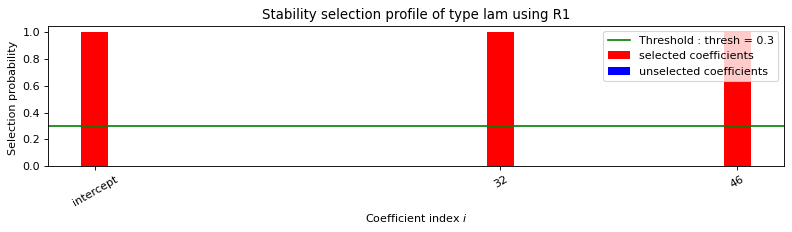

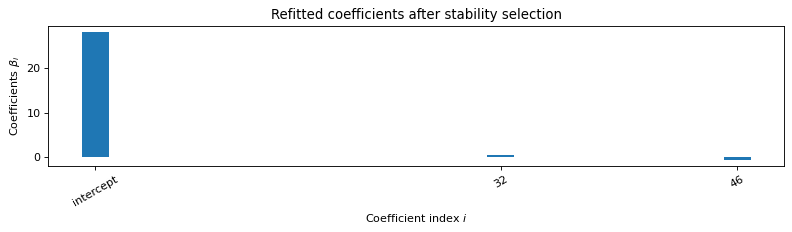

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.071s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.57 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 8.39

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.66]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 8.13

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 10.43

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -7788.078
Model:                         IV2SLS   Adj. R-squared:              -8164.046
Method:                     Two Stage   F-statistic:                -1.431e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:39:23                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.8062   5.02e+08   9.58e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.11 0.14 0.01 0.01 0.01 0.01 0.01
 -0.05 -0.14 0.01 -0.04 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.02 0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.14
 -0.01 -0.01 -0.01 -0.01 -0.01 0.04 0.14 -0.01 0.04 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.69 -0.01 -0.53]

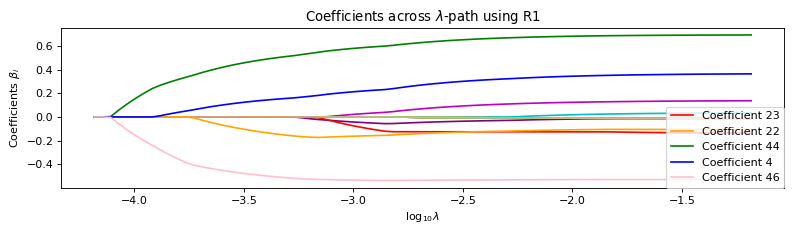

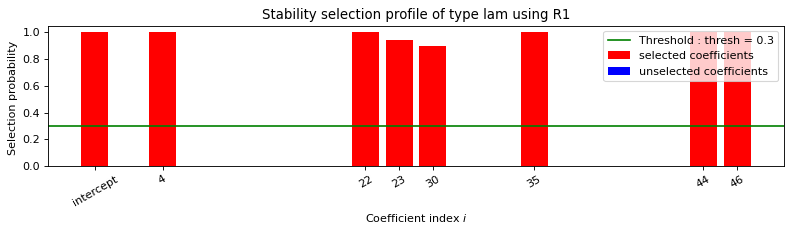

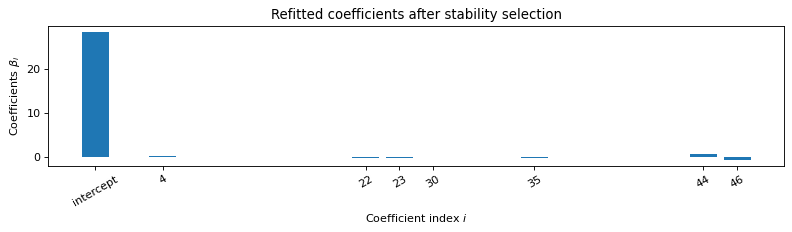


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.114s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.24 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.65 0.00 -0.54]
Error: 0.2

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------------

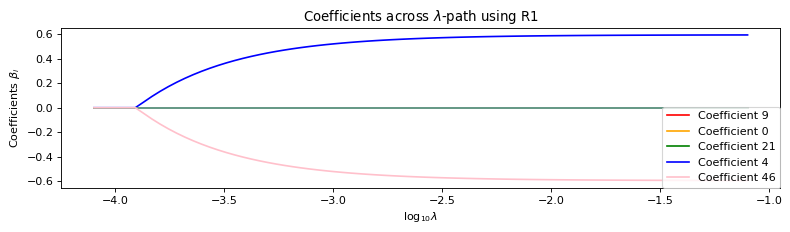

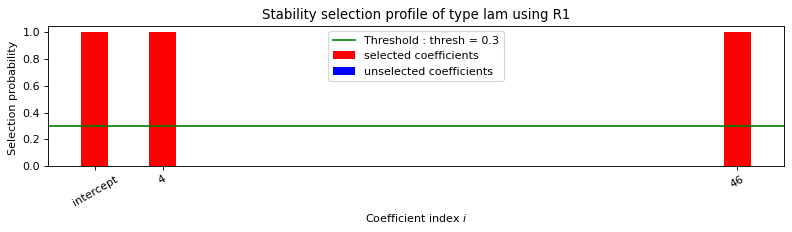

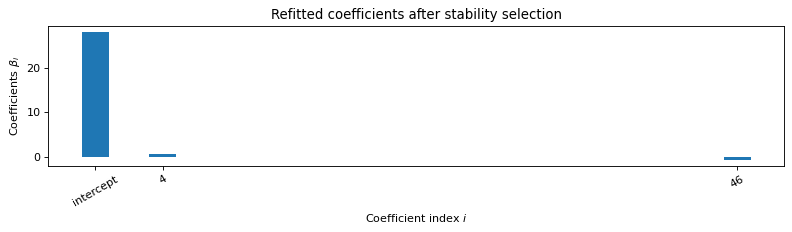


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.108s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.60 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.60]
Error: 4.53

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


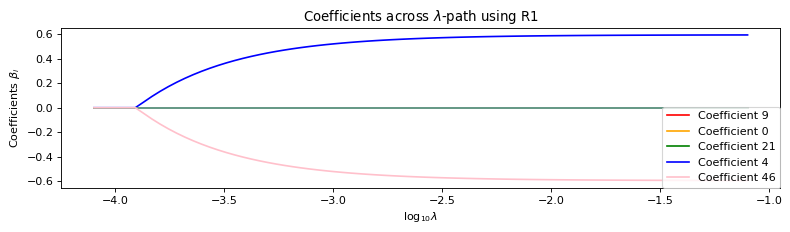

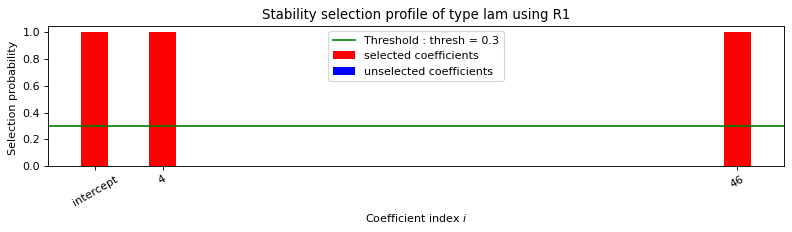

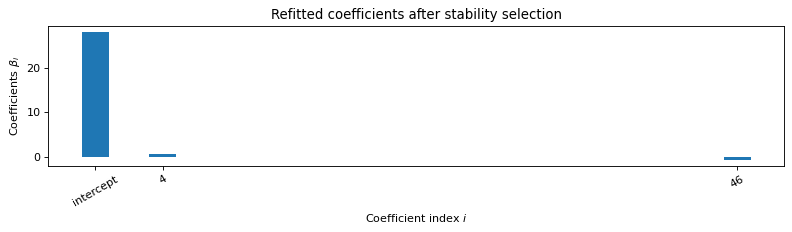

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.087s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 4.53

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-6.00]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.48

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.7

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:             -4112900006.500
Model:                         IV2SLS   Adj. R-squared:        -4311424036.243
Method:                     Two Stage   F-statistic:                 8.107e-18
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:42:17                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        642.5431   1.12e+12   5.76e-10      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.11 0.12 0.01 0.01 0.01 0.01 0.01
 -0.04 -0.15 0.01 -0.03 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.02 0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.12
 -0.01 -0.01 -0.01 -0.01 -0.01 0.03 0.14 -0.01 0.03 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.69 -0.01 -0.54]

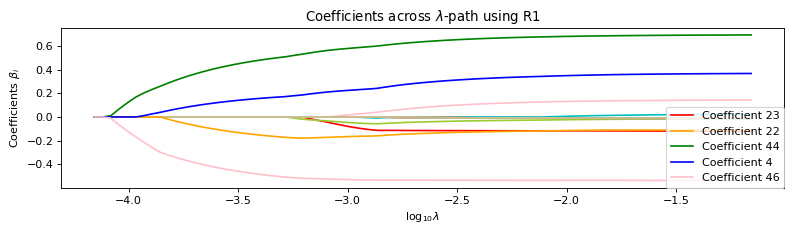

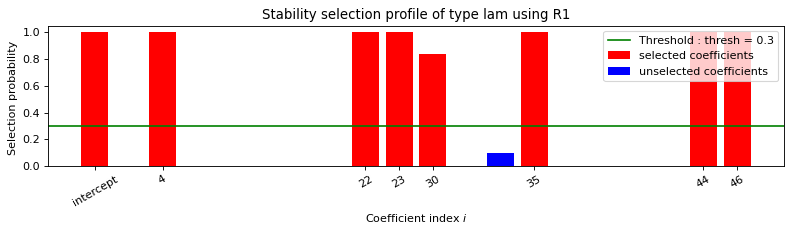

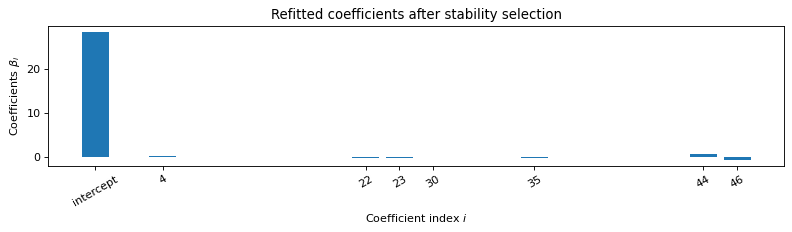


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.112s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.23 0.00 0.00 0.00 0.00
 0.00 0.00 0.09 0.00 0.00 0.00 0.00 -0.10 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.65 0.00 -0.55]
Error: 0.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

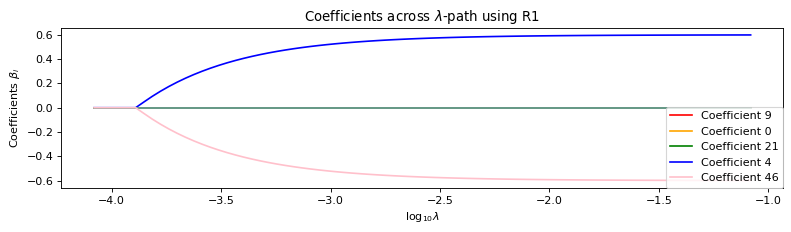

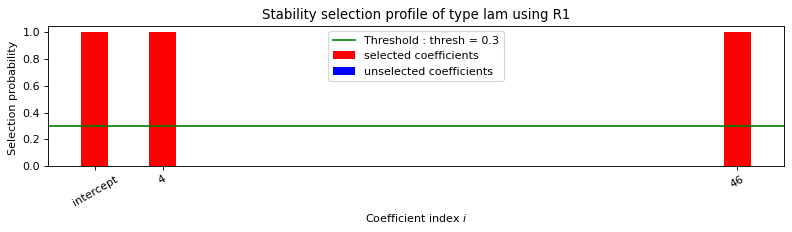

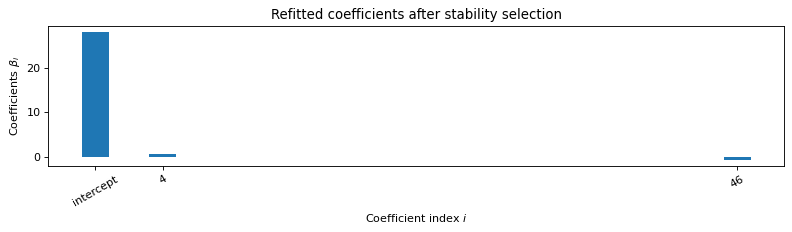


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.074s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.60 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.60]
Error: 4.67

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


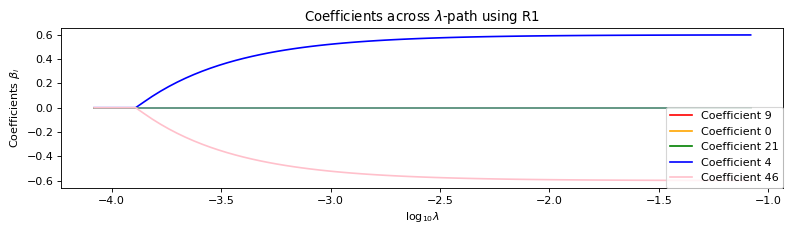

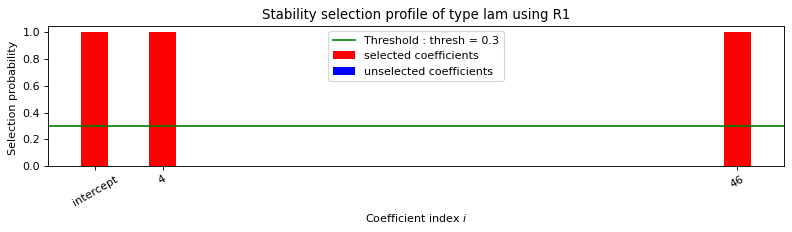

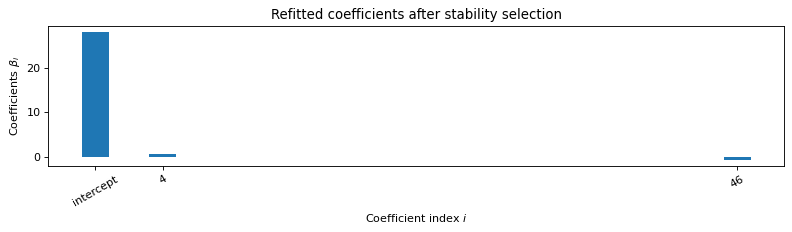

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.057s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.54 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.61]
Error: 4.67

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.85]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.63

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.42

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -219533.387
Model:                         IV2SLS   Adj. R-squared:            -230130.010
Method:                     Two Stage   F-statistic:                -4.729e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:46:13                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5607        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.11 0.14 0.01 0.01 0.01 0.01 0.01
 -0.06 -0.13 0.01 -0.01 0.01 0.01 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.02 0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.14
 -0.01 -0.01 -0.01 -0.01 -0.01 0.06 0.13 -0.01 0.01 -0.01 -0.01 -0.02
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.70 -0.01 -0.52]

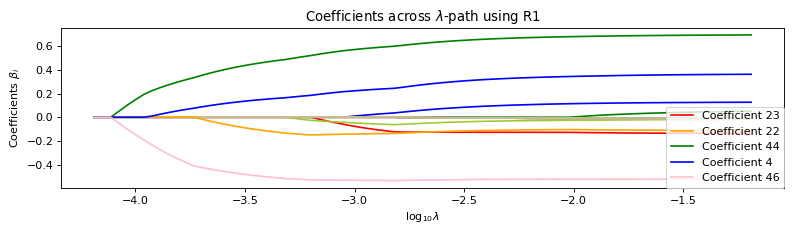

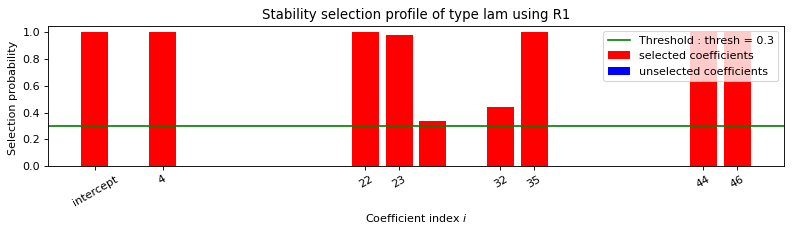

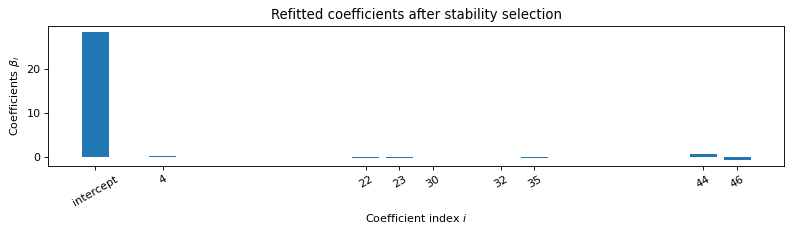


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.101s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.21 0.00 0.00 0.00 0.00
 0.00 0.00 0.09 0.00 -0.06 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.65 0.00 -0.54]
Error: 0.12

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

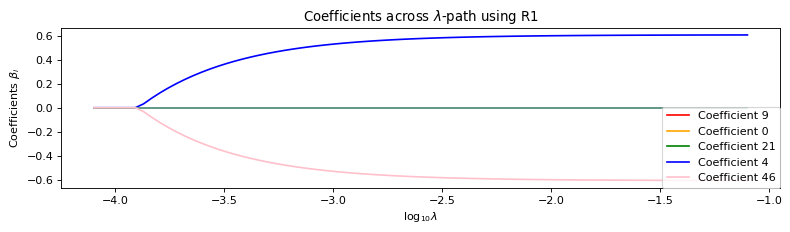

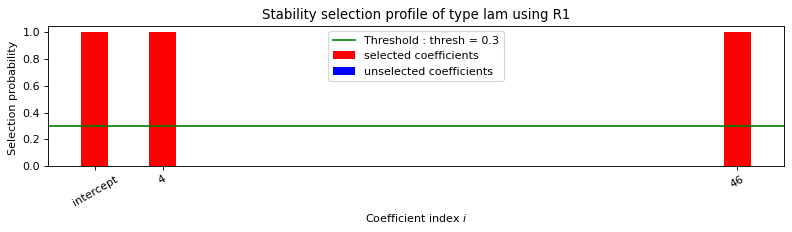

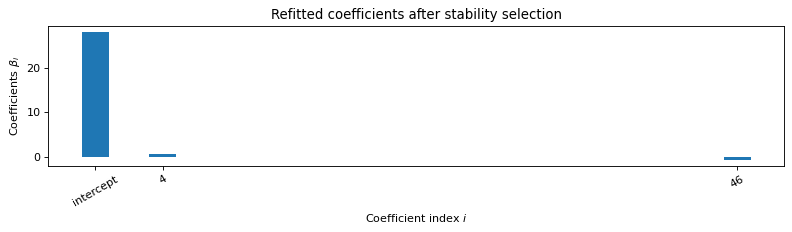


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.061s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.61 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.61]
Error: 4.78

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


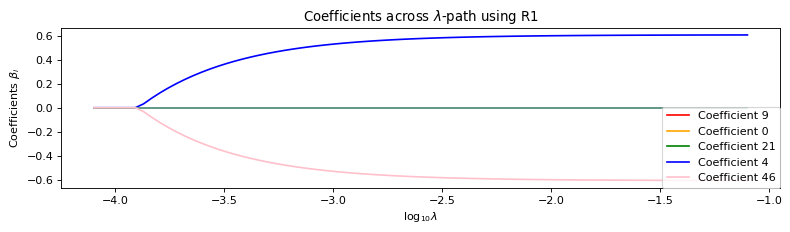

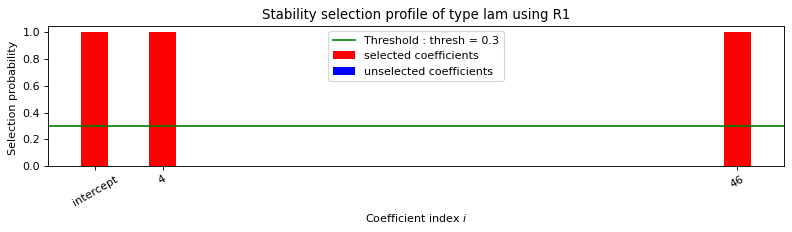

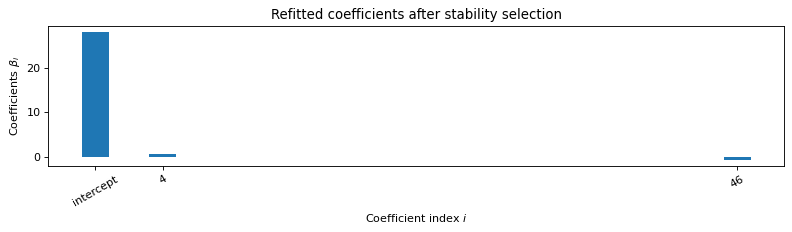

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.065s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.54 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.61]
Error: 4.78

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [-2.76]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 8.4

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.92

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -221819.879
Model:                         IV2SLS   Adj. R-squared:            -232526.868
Method:                     Two Stage   F-statistic:                -7.914e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:49:18                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         97.3636        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.10 0.15 0.01 0.01 0.01 0.01 0.01
 -0.05 -0.13 0.01 -0.03 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.02 0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.09 -0.15
 -0.01 -0.01 -0.01 -0.01 -0.01 0.05 0.13 -0.01 0.03 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.69 -0.01 -0.53]

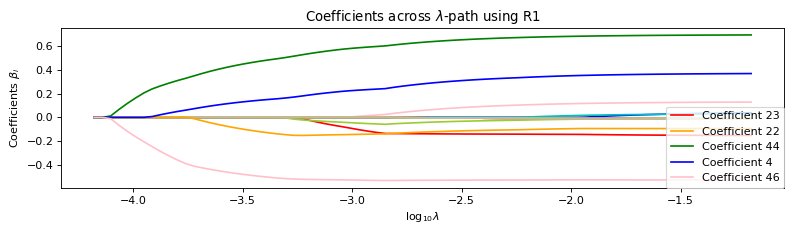

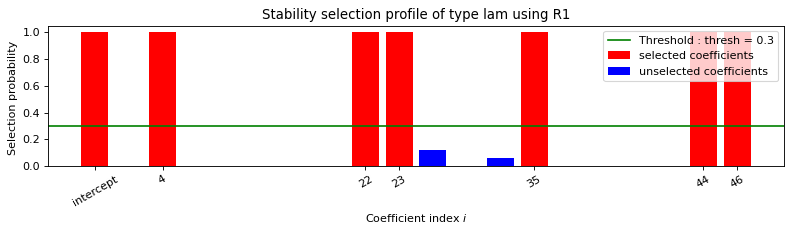

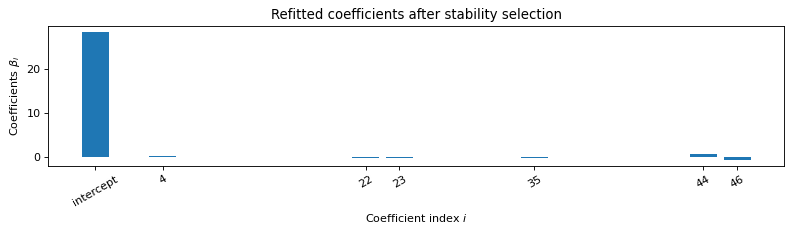


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    35    44    46    
   Running time :  0.092s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.29 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.21 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.08 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.66 0.00 -0.53]
Error: 0.21

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------------

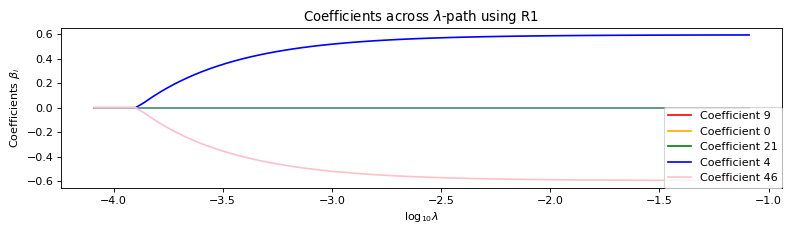

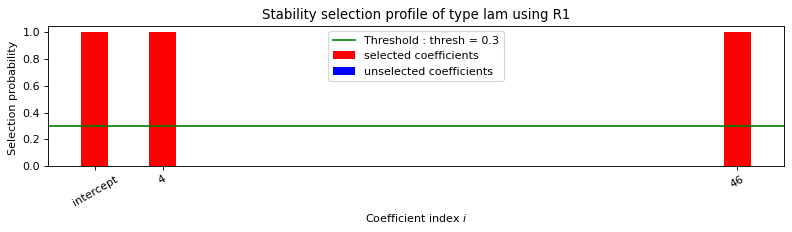

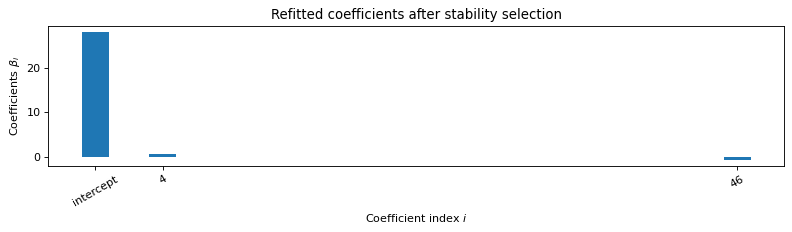


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.061s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.60 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.60]
Error: 4.54

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


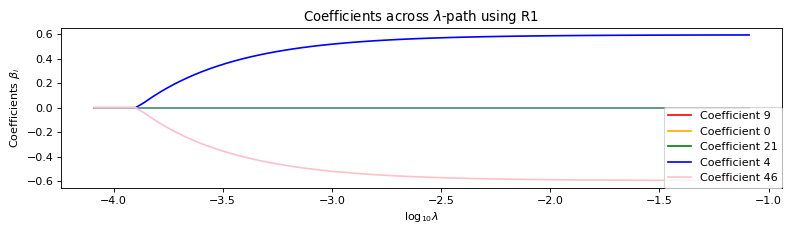

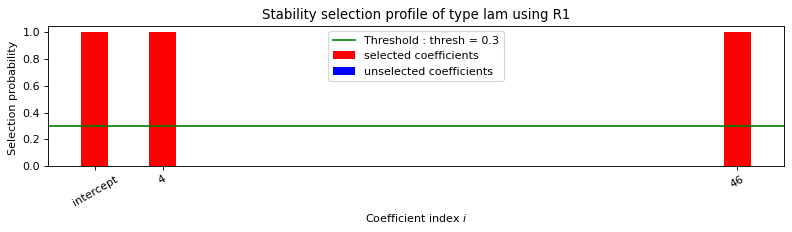

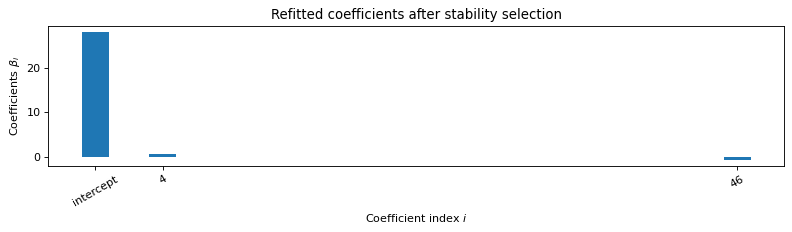

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.077s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 4.54

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-7.49]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.91

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -31508.525
Model:                         IV2SLS   Adj. R-squared:             -33029.446
Method:                     Two Stage   F-statistic:                -2.495e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:52:00                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -20.4115        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.10 0.12 0.01 0.01 0.01 0.01 0.01
 -0.04 -0.14 0.01 -0.04 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.70 0.03 0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.10 -0.12
 -0.01 -0.01 -0.01 -0.01 -0.01 0.04 0.14 -0.01 0.04 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.70 -0.01 -0.53]

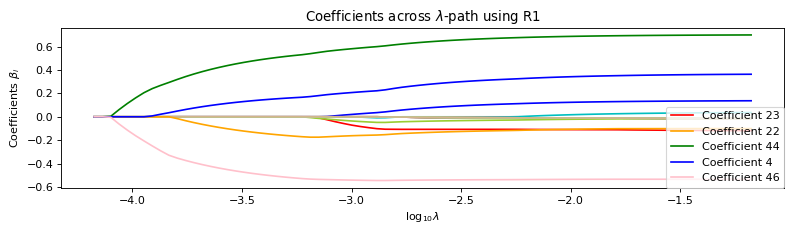

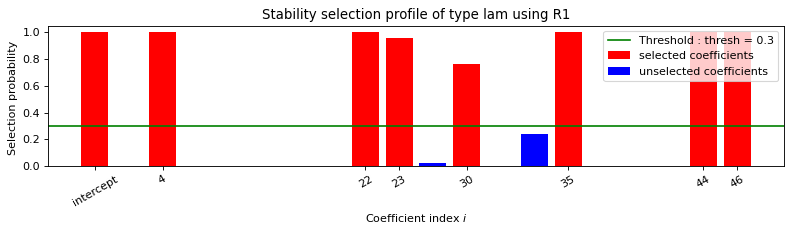

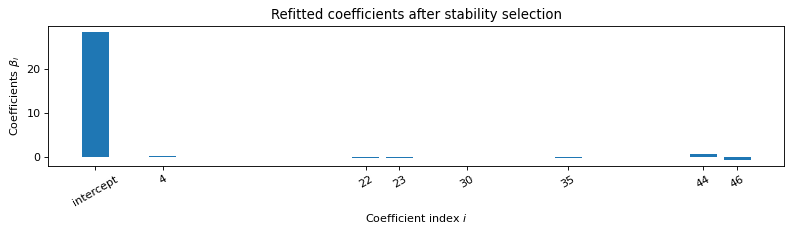


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.113s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.27 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.23 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.65 0.00 -0.56]
Error: 0.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

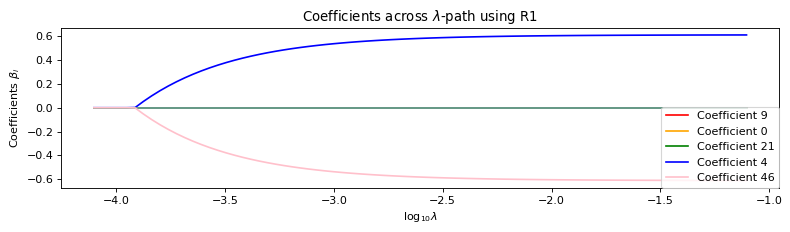

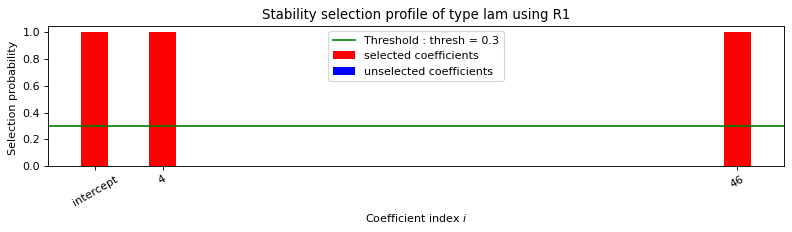

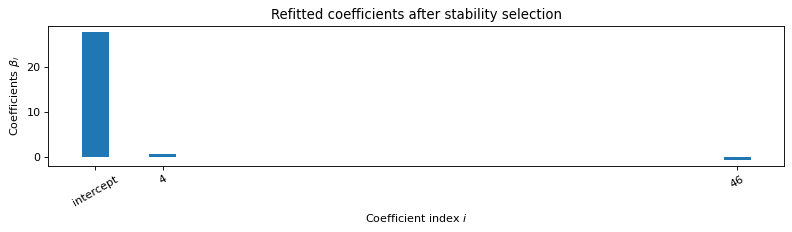


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.071s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.61 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.61]
Error: 5.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


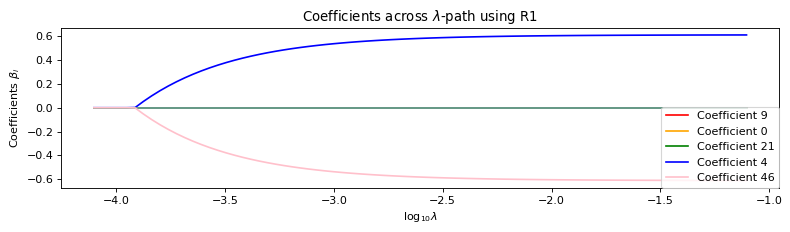

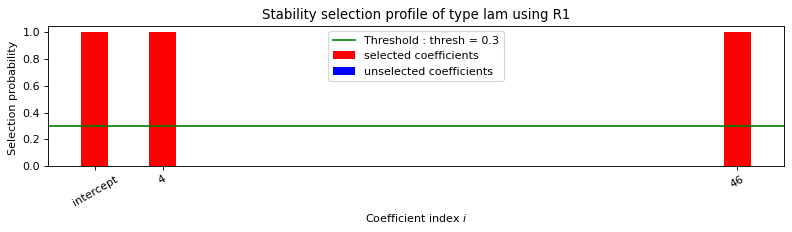

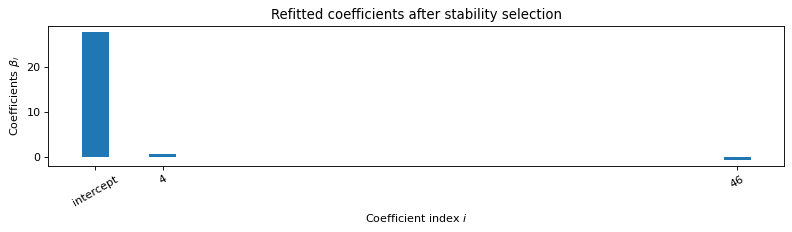

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.55 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.05 0.04
 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01
 0.01 0.01 0.01 0.62]
Error: 5.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-6.79]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 5.64

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.21

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -37255.755
Model:                         IV2SLS   Adj. R-squared:             -39054.087
Method:                     Two Stage   F-statistic:                 3.043e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:54:33                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         25.1902   4.45e+08   5.67e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.11 0.13 0.01 0.01 0.01 0.01 0.01
 -0.04 -0.15 0.01 -0.04 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.03 0.53]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.14
 -0.01 -0.01 -0.01 -0.01 -0.01 0.04 0.14 -0.01 0.04 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.70 -0.01 -0.53]

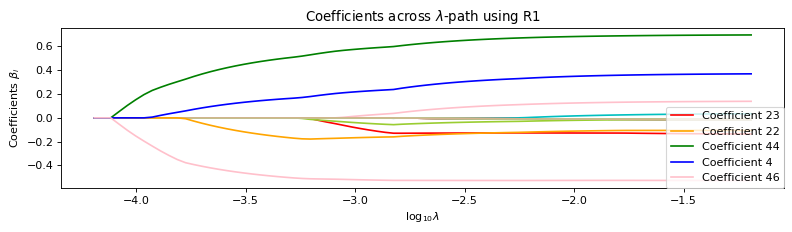

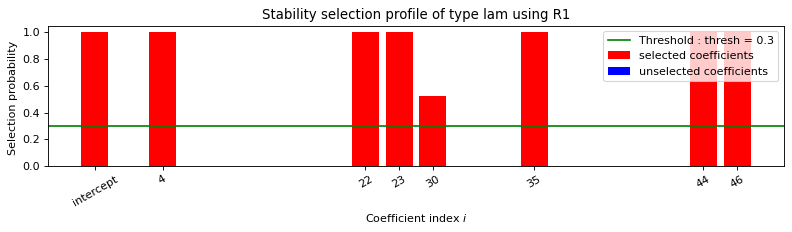

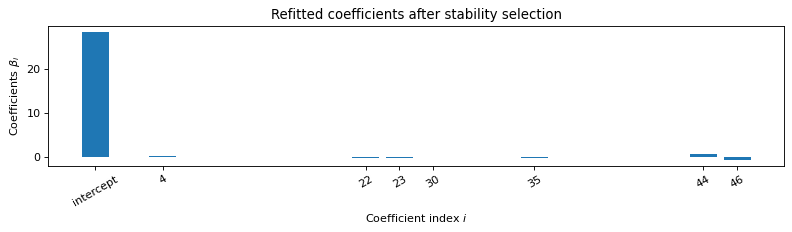


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.077s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.23 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.09 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.64 0.00 -0.54]
Error: 0.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

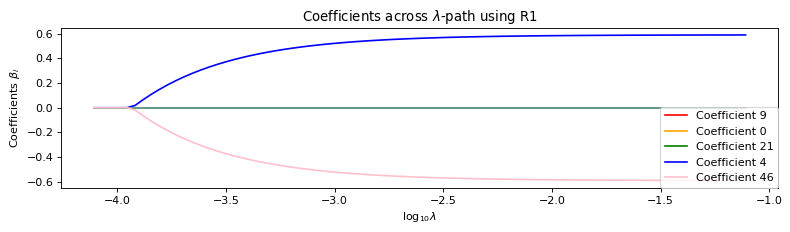

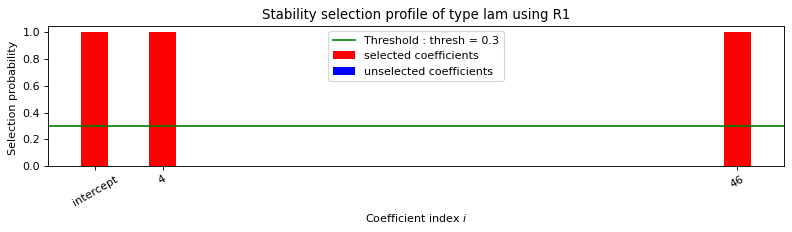

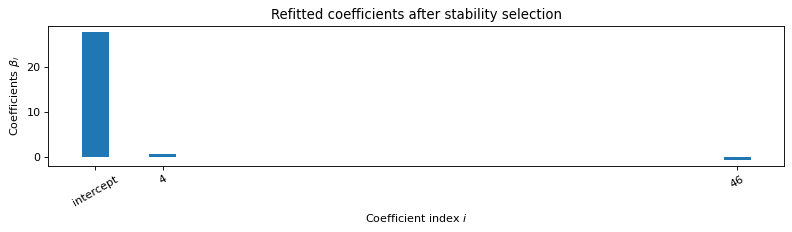


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.048s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 4.53

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


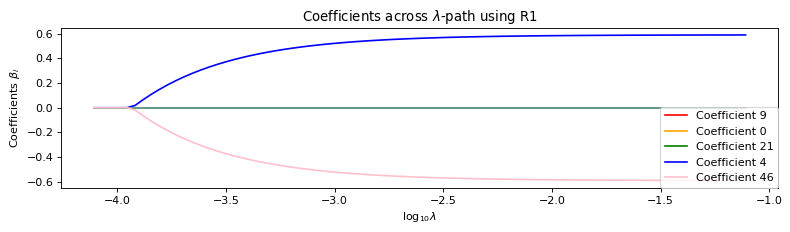

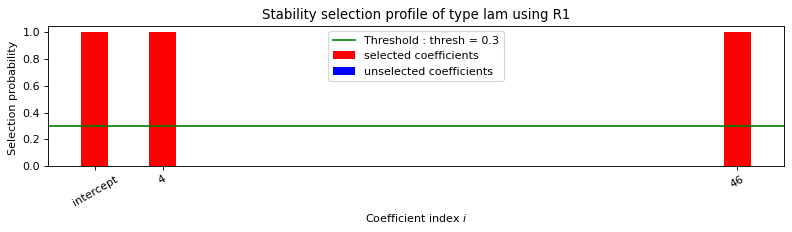

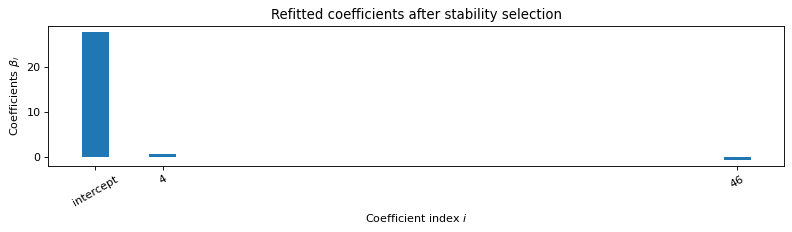

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.055s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 4.53

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-10.22]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 6.66

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.24

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -44134.171
Model:                         IV2SLS   Adj. R-squared:             -46264.515
Method:                     Two Stage   F-statistic:                 1.625e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:57:01                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -14.2449        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.11 0.17 0.01 0.01 0.00 0.00 0.00
 -0.03 -0.13 0.01 -0.03 0.01 0.01 0.03 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.69 0.02 0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.37 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.10 -0.17
 -0.01 -0.01 -0.01 -0.01 -0.01 0.02 0.13 -0.01 0.03 -0.01 -0.01 -0.03
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.69 -0.01 -0.53]

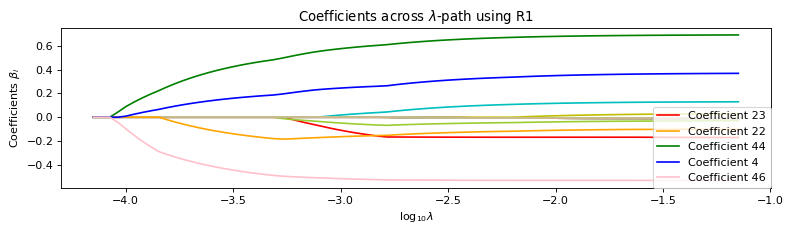

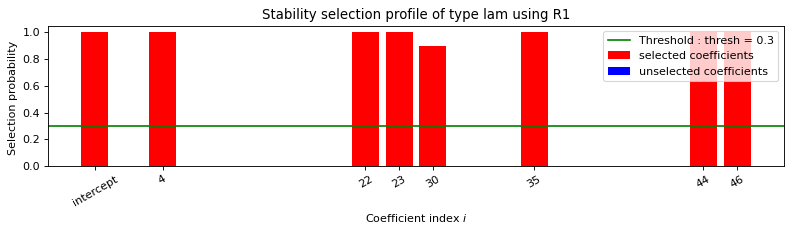

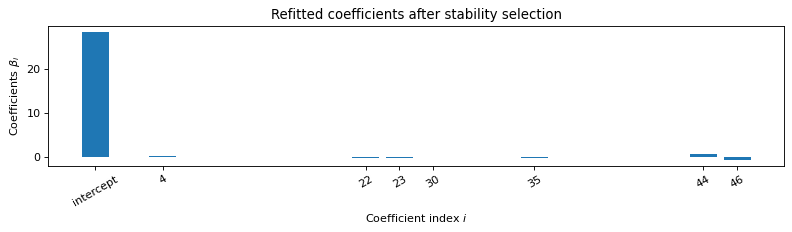


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    35    44    46    
   Running time :  0.079s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.29 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.26 0.00 0.00 0.00 0.00
 0.00 0.00 0.08 0.00 0.00 0.00 0.00 -0.10 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.66 0.00 -0.54]
Error: 0.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

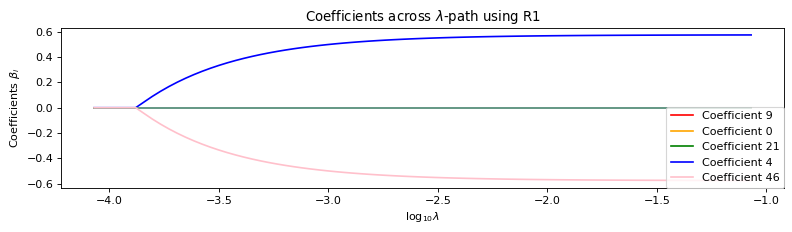

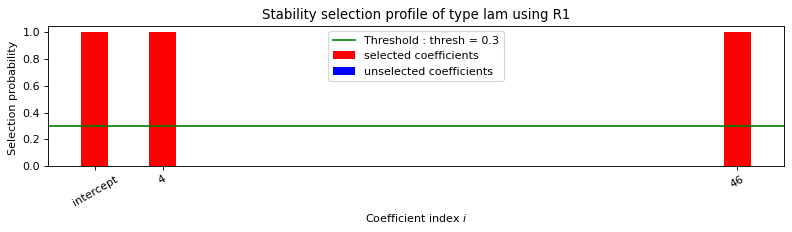

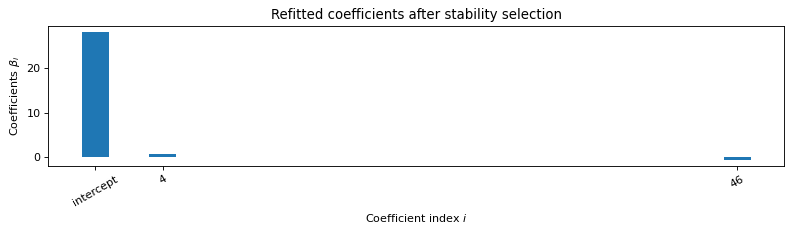


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.048s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 4.77

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


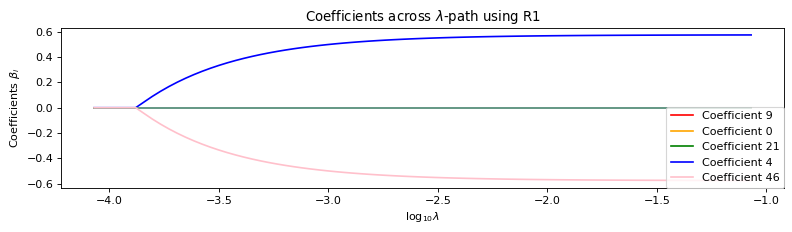

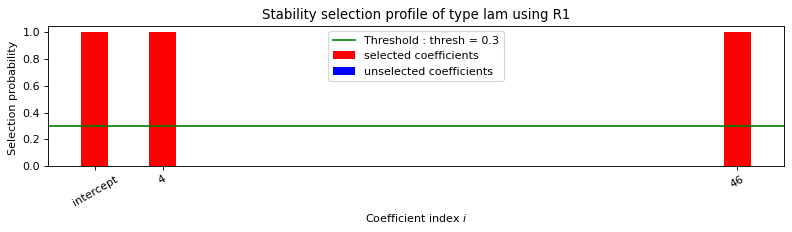

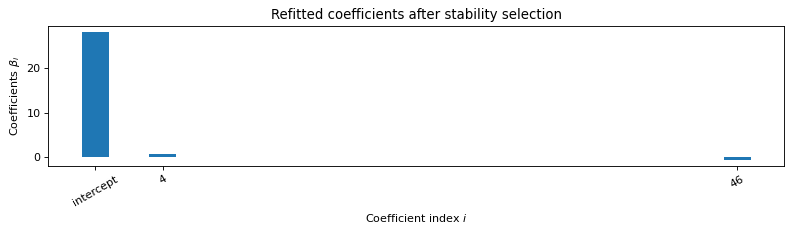

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.048s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 4.77

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:KIV1 minimization did not succeed.
INFO:absl:Optimal lambda [-9.65]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.00]...
INFO:absl:Predict treatment effect...


Error: 7.07

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 0.04

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -667251.819
Model:                         IV2SLS   Adj. R-squared:            -699459.195
Method:                     Two Stage   F-statistic:                 5.091e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mi, 14 Jul 2021                                         
Time:                        11:59:21                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -88.5996        nan        nan        n

In [54]:
today = datetime.now()
num_iteration = 20

df_beta, df_mse, mse_large_confidence= run_methods_confidence_interval(
    param.key, num_iteration, 
    param.n, param.p, param.num_inst, param.mu_c, param.c_X, 
    param.alpha0, param.alphaT, param.c_Y, param.beta0, param.betaT, 
    is_nonlinear=False, is_negbinom=True,
    num_star=250, logcontrast_threshold=0.3)

In [55]:
import pickle
results = {
    "df_mse": df_mse,
    "df_beta": df_beta,
    "mse_large": mse_large_confidence
}

with open(os.path.join(os.getcwd(),"temp", "results_real.pickle"), "wb") as f:
    pickle.dump(results, f)
    f.close()

In [56]:
with open(os.path.join(os.getcwd(),"temp", "results_real.pickle"), "rb") as f:
    results = pickle.load(f)
    df_mse = results["df_mse"]
    df_beta = results["df_beta"]
    f.close()

# Generation of final plots

## Out of sample MSE plots

In [102]:
filter_list = ["ALR+LC", "ONLY Second LC", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.show()

In [103]:
filter_list = ["ALR+LC", "ILR+LC", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.update_yaxes(range=(0, 11))
fig.show()

In [104]:
filter_list = ["ALR+LC", "ILR+LC", "DIR+LC", "ILR+ILR", "ONLY Second LC", "ONLY Second ILR", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.update_yaxes(range=(0, 1000000))
fig.show()

## True $\beta$ vs. estimated $\beta$s.

In [108]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, betaT, filter_list, sort_to_filter=True)
fig.update_layout(showlegend=False)
fig.update_yaxes(range=(-100, 60))
fig.update_layout(width=2000, height=500)
fig.show()

In [117]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, betaT, filter_list, sort_to_filter=True)
fig.update_layout(showlegend=False)
fig.update_yaxes(range=(-1, 1))
fig.update_layout(width=2000, height=500)
fig.show()

In [116]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, betaT, filter_list, sort_to_filter=True, beta_zero=True)
fig.update_layout(showlegend=False)
fig.update_yaxes(range=(-1, 1))
fig.update_layout(width=2000, height=500)
fig.show()

In [66]:
fig = plot_beta_results(df_beta, betaT, filter_list, beta_zero=True)


fig.update_yaxes(range=(-1, 1))
fig.update_layout(width=2000, height=500)
fig.show()


KeyError: 0.11299999803304672